<a href="https://colab.research.google.com/github/nemoiitkgp/FWI-Codes-PhD/blob/main/BP_2004_GPU_T4_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip -q install deepwave scikit-image

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.0/48.0 MB 15.2 MB/s eta 0:00:00


Using device: cuda
Grid: 1799x637 | dx=37.5m | Target: 7.0Hz

--- STAGE 1: 3.0 Hz ---
Epoch 5/50 | Scaled Loss: 0.133028
Epoch 10/50 | Scaled Loss: 0.102617
Epoch 15/50 | Scaled Loss: 0.085668
Epoch 20/50 | Scaled Loss: 0.075131
Epoch 25/50 | Scaled Loss: 0.068981
Epoch 30/50 | Scaled Loss: 0.060374
Epoch 35/50 | Scaled Loss: 0.057806
Epoch 40/50 | Scaled Loss: 0.054639
Epoch 45/50 | Scaled Loss: 0.050181
Epoch 50/50 | Scaled Loss: 0.050401

--- STAGE 2: 5.0 Hz ---
Epoch 5/50 | Scaled Loss: 0.131743
Epoch 10/50 | Scaled Loss: 0.109975
Epoch 15/50 | Scaled Loss: 0.113235
Epoch 20/50 | Scaled Loss: 0.097356
Epoch 25/50 | Scaled Loss: 0.097982
Epoch 30/50 | Scaled Loss: 0.090410
Epoch 35/50 | Scaled Loss: 0.089451
Epoch 40/50 | Scaled Loss: 0.088255
Epoch 45/50 | Scaled Loss: 0.092076
Epoch 50/50 | Scaled Loss: 0.095824

--- STAGE 3: 7.0 Hz ---


/usr/local/lib/python3.12/dist-packages/deepwave/common.py:1191: UserWarning: At least six grid cells per wavelength is recommended, but at a frequency of 7.0, a minimum non-zero velocity of 1429.000244140625, and a grid cell spacing of 37.5, there are only 5.44.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/deepwave/common.py:1191: UserWarning: At least six grid cells per wavelength is recommended, but at a frequency of 7.0, a minimum non-zero velocity of 1450.0, and a grid cell spacing of 37.5, there are only 5.52.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/deepwave/common.py:1191: UserWarning: At least six grid cells per wavelength is recommended, but at a frequency of 7.0, a minimum non-zero velocity of 1449.999755859375, and a grid cell spacing of 37.5, there are only 5.52.
  warnings.warn(


Epoch 5/50 | Scaled Loss: 0.152799
Epoch 10/50 | Scaled Loss: 0.151150
Epoch 15/50 | Scaled Loss: 0.146509
Epoch 20/50 | Scaled Loss: 0.148605
Epoch 25/50 | Scaled Loss: 0.140622
Epoch 30/50 | Scaled Loss: 0.131128
Epoch 35/50 | Scaled Loss: 0.136416
Epoch 40/50 | Scaled Loss: 0.131069
Epoch 45/50 | Scaled Loss: 0.141437
Epoch 50/50 | Scaled Loss: 0.136192


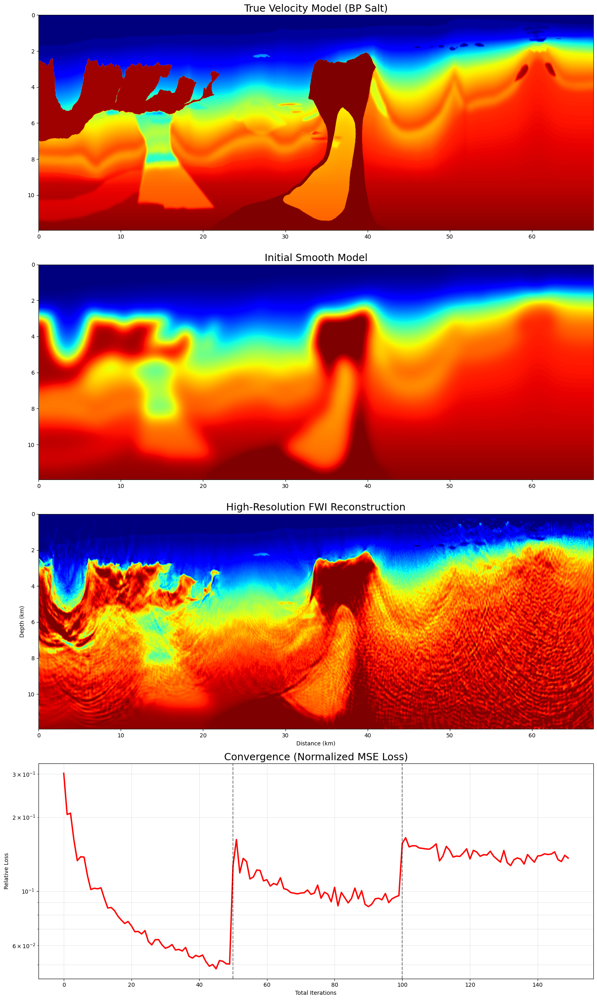

In [ ]:
import os
import gc
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import deepwave
from deepwave import scalar
from scipy.ndimage import gaussian_filter

# --- CONFIGURATION & MEMORY ---
os.environ['PYTORCH_ALLOC_CONF'] = 'expandable_segments:True'

def cleanup():
    torch.cuda.empty_cache()
    gc.collect()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# --- ADVANCED GPU SMOOTHING (Edge Preserving) ---
def gpu_smooth(img, sigma):
    if sigma <= 0.1: return img
    kernel_size = int(2 * 4 * sigma + 1)
    if kernel_size % 2 == 0: kernel_size += 1
    x = torch.arange(kernel_size).to(device) - (kernel_size - 1) / 2
    kernel_1d = torch.exp(-x.pow(2) / (2 * sigma**2))
    kernel_1d /= kernel_1d.sum()
    kernel_2d = kernel_1d[:, None] * kernel_1d[None, :]
    kernel_2d = kernel_2d.expand(1, 1, -1, -1)
    img = F.pad(img.unsqueeze(0).unsqueeze(0), (kernel_size//2,)*4, mode='replicate')
    img = F.conv2d(img, kernel_2d)
    return img.squeeze()

# --- BP SALT MODEL LOADING ---
vp_path = 'BP_salt.bin'
nx0, nz0 = 5395, 1911
dx0, dz0 = 12.5, 6.25

if not os.path.exists(vp_path):
    print("Warning: BP_salt.bin not found. Using dummy for script verification.")
    vp_cpu = torch.ones(nx0, nz0) * 2000.0
else:
    vp_cpu = torch.from_file(vp_path, size=nx0 * nz0, dtype=torch.float32).reshape(nx0, nz0)

# Factor 3.0 (dx=37.5m) - This eliminates the 6Hz dispersion warning
factor = 3.0
vp_reduced = gaussian_filter(vp_cpu.numpy(), sigma=0.5)[::int(factor), ::int(factor)]
nx, nz = vp_reduced.shape
dx, dz = dx0 * factor, dz0 * factor
spacing = (dx, dz)

v_true = torch.from_numpy(vp_reduced).to(device)
v_init = torch.from_numpy(1.0 / gaussian_filter(1.0 / vp_reduced, sigma=20)).to(device)
v1 = v_init.clone().requires_grad_()

# --- ACQUISITION ---
n_shots = 24
batch_size = 3 # Adjusted for 15GB VRAM at dx=37.5
n_receivers_per_shot = 400
nt = 2000
dt = 0.004

source_loc = torch.zeros(n_shots, 1, 2, dtype=torch.long, device=device)
source_loc[:, 0, 0] = torch.linspace(20, nx - 21, n_shots).long()
source_loc[:, 0, 1] = 4

receiver_loc = torch.zeros(n_shots, n_receivers_per_shot, 2, dtype=torch.long, device=device)
receiver_loc[..., 1] = 4
for i in range(n_shots):
    receiver_loc[i, :, 0] = torch.linspace(0, nx - 1, n_receivers_per_shot).long()

# --- PRE-CONDITIONING ---
water_depth_cells = int(450 / dz)
mask = torch.ones_like(v_init)
mask[:, :water_depth_cells] = 0.0
z_grad = torch.linspace(0, 1, nz).to(device)
depth_weight = (1.0 + 45.0 * z_grad**2.5).repeat(nx, 1) # Stronger weight for salt base

# --- MULTI-SCALE INVERSION ---
freqs = [3.0, 5.0, 7.0]
epochs_per_stage = 50
# Gradual learning rate reduction
lrs = [25.0, 15.0, 8.0]
history = []

print(f"Grid: {nx}x{nz} | dx={dx:.1f}m | Target: {freqs[-1]}Hz")

for f_idx, freq in enumerate(freqs):
    print(f"\n--- STAGE {f_idx+1}: {freq} Hz ---")
    cleanup()

    peak_time = 1.5 / freq
    source_amp = deepwave.wavelets.ricker(freq, nt, dt, peak_time).repeat(n_shots, 1, 1).to(device)

    # Observe data with wider PML to avoid boundary reflections (ripples)
    with torch.no_grad():
        obs_data_list = []
        for i in range(0, n_shots, batch_size):
            out = scalar(v_true, spacing, dt,
                         source_amplitudes=source_amp[i:min(i+batch_size, n_shots)],
                         source_locations=source_loc[i:min(i+batch_size, n_shots)],
                         receiver_locations=receiver_loc[i:min(i+batch_size, n_shots)],
                         pml_freq=freq, pml_width=[40, 40, 40, 40])
            obs_data_list.append(out[-1])
        obs_data = torch.cat(obs_data_list, dim=0)

    optimizer = torch.optim.Adam([v1], lr=lrs[f_idx])

    for epoch in range(epochs_per_stage):
        optimizer.zero_grad()
        epoch_loss = 0

        # Randomize shots to help skip local minima
        perm = torch.randperm(n_shots)

        for i in range(0, n_shots, batch_size):
            indices = perm[i:min(i+batch_size, n_shots)]

            out_pred = scalar(v1, spacing, dt,
                              source_amplitudes=source_amp[indices],
                              source_locations=source_loc[indices],
                              receiver_locations=receiver_loc[indices],
                              pml_freq=freq, pml_width=[40, 40, 40, 40],
                              model_gradient_sampling_interval=10) # VRAM Save

            # Normalizing loss by the scale of the observed data to prevent "jumps"
            loss = F.mse_loss(out_pred[-1], obs_data[indices]) / F.mse_loss(obs_data[indices], torch.zeros_like(obs_data[indices]))
            loss.backward()
            epoch_loss += loss.item()

        # Gradient Post-processing
        with torch.no_grad():
            # Apply Mask and Depth Gain
            v1.grad *= (mask * depth_weight)

            # Multi-scale smoothing: Sigma decreases as frequency increases
            # This allows the model to capture details while keeping salt solid
            sigma_val = 3.5 / (f_idx + 1)
            v1.grad.copy_(gpu_smooth(v1.grad, sigma=sigma_val))

        optimizer.step()

        # Hard constraints for BP model stability
        v1.data.clamp_(min=1450.0, max=4850.0)

        # Smooth the model itself slightly every epoch to prevent "checkerboard" artifacts
        if epoch % 2 == 0:
            v1.data.copy_(gpu_smooth(v1.data, sigma=0.2))

        avg_loss = epoch_loss / (n_shots // batch_size)
        history.append(avg_loss)

        if (epoch + 1) % 5 == 0:
            print(f"Epoch {epoch+1}/{epochs_per_stage} | Scaled Loss: {avg_loss:.6f}")

# --- FINAL VISUALIZATION ---
fig, ax = plt.subplots(4, 1, figsize=(15, 25))
extent = [0, (nx*dx)/1000, (nz*dz)/1000, 0]
opts = {'cmap': 'jet', 'aspect': 'auto', 'extent': extent, 'vmin': 1500, 'vmax': 4600}

ax[0].imshow(v_true.cpu().T, **opts)
ax[0].set_title("True Velocity Model (BP Salt)", fontsize=18)

ax[1].imshow(v_init.cpu().T, **opts)
ax[1].set_title("Initial Smooth Model", fontsize=18)

im = ax[2].imshow(v1.detach().cpu().T, **opts)
ax[2].set_title("High-Resolution FWI Reconstruction", fontsize=18)
ax[2].set_xlabel("Distance (km)")
ax[2].set_ylabel("Depth (km)")

# Improved Loss Plot
ax[3].plot(history, color='red', lw=2.5)
ax[3].set_title("Convergence (Normalized MSE Loss)", fontsize=18)
ax[3].set_xlabel("Total Iterations")
ax[3].set_ylabel("Relative Loss")
ax[3].set_yscale('log')
ax[3].grid(True, which="both", ls="-", alpha=0.3)
# Mark stage transitions
for i in range(1, len(freqs)):
    ax[3].axvline(x=i*epochs_per_stage, color='black', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

Using device: cuda
Grid: 1799x637 | dx=37.5m | Target: 7.0Hz

--- STAGE 1: 3.0 Hz ---
Epoch 5/100 | Scaled Loss: 0.140829
Epoch 10/100 | Scaled Loss: 0.103997
Epoch 15/100 | Scaled Loss: 0.086968
Epoch 20/100 | Scaled Loss: 0.074958
Epoch 25/100 | Scaled Loss: 0.065922
Epoch 30/100 | Scaled Loss: 0.059962
Epoch 35/100 | Scaled Loss: 0.053996
Epoch 40/100 | Scaled Loss: 0.051108
Epoch 45/100 | Scaled Loss: 0.048577
Epoch 50/100 | Scaled Loss: 0.050558
Epoch 55/100 | Scaled Loss: 0.048273
Epoch 60/100 | Scaled Loss: 0.046149
Epoch 65/100 | Scaled Loss: 0.044204
Epoch 70/100 | Scaled Loss: 0.045145
Epoch 75/100 | Scaled Loss: 0.039418
Epoch 80/100 | Scaled Loss: 0.041532
Epoch 85/100 | Scaled Loss: 0.041045
Epoch 90/100 | Scaled Loss: 0.041026
Epoch 95/100 | Scaled Loss: 0.038598
Epoch 100/100 | Scaled Loss: 0.041141

--- STAGE 2: 5.0 Hz ---
Epoch 5/60 | Scaled Loss: 0.114164
Epoch 10/60 | Scaled Loss: 0.100703
Epoch 15/60 | Scaled Loss: 0.087721
Epoch 20/60 | Scaled Loss: 0.088548
Epoch 

/usr/local/lib/python3.12/dist-packages/deepwave/common.py:1191: UserWarning: At least six grid cells per wavelength is recommended, but at a frequency of 7.0, a minimum non-zero velocity of 1429.000244140625, and a grid cell spacing of 37.5, there are only 5.44.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/deepwave/common.py:1191: UserWarning: At least six grid cells per wavelength is recommended, but at a frequency of 7.0, a minimum non-zero velocity of 1450.0, and a grid cell spacing of 37.5, there are only 5.52.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/deepwave/common.py:1191: UserWarning: At least six grid cells per wavelength is recommended, but at a frequency of 7.0, a minimum non-zero velocity of 1449.999755859375, and a grid cell spacing of 37.5, there are only 5.52.
  warnings.warn(


Epoch 5/20 | Scaled Loss: 0.134759
Epoch 10/20 | Scaled Loss: 0.137291
Epoch 15/20 | Scaled Loss: 0.133997
Epoch 20/20 | Scaled Loss: 0.139264


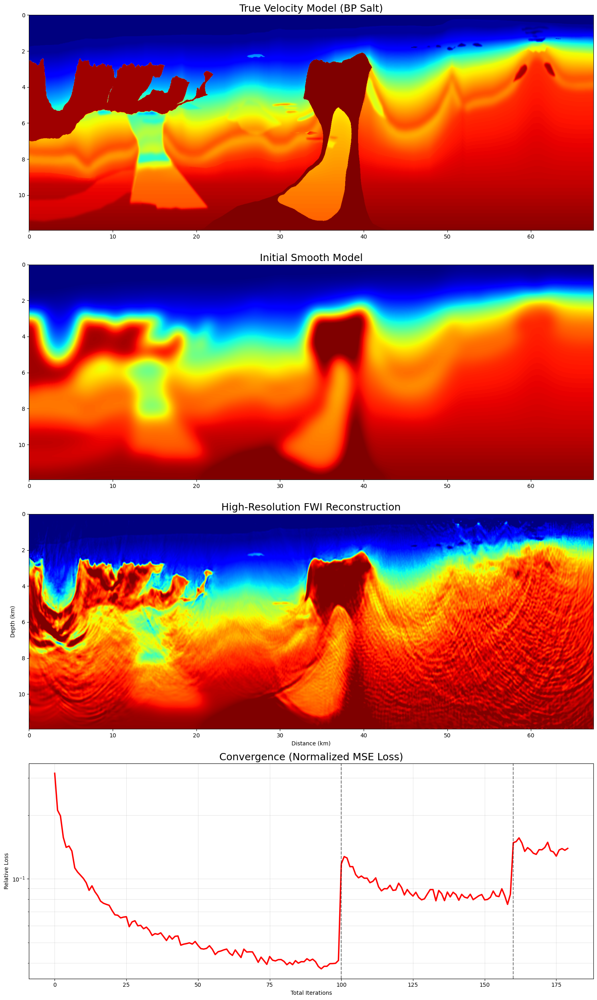

In [ ]:
import os
import gc
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import deepwave
from deepwave import scalar
from scipy.ndimage import gaussian_filter

# --- CONFIGURATION & MEMORY ---
os.environ['PYTORCH_ALLOC_CONF'] = 'expandable_segments:True'

def cleanup():
    torch.cuda.empty_cache()
    gc.collect()

#device = torch.device('cuda' if torch.available() else 'cpu')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# --- ADVANCED GPU SMOOTHING (Edge Preserving) ---
def gpu_smooth(img, sigma):
    if sigma <= 0.1: return img
    kernel_size = int(2 * 4 * sigma + 1)
    if kernel_size % 2 == 0: kernel_size += 1
    x = torch.arange(kernel_size).to(device) - (kernel_size - 1) / 2
    kernel_1d = torch.exp(-x.pow(2) / (2 * sigma**2))
    kernel_1d /= kernel_1d.sum()
    kernel_2d = kernel_1d[:, None] * kernel_1d[None, :]
    kernel_2d = kernel_2d.expand(1, 1, -1, -1)
    img = F.pad(img.unsqueeze(0).unsqueeze(0), (kernel_size//2,)*4, mode='replicate')
    img = F.conv2d(img, kernel_2d)
    return img.squeeze()

# --- BP SALT MODEL LOADING ---
vp_path = 'BP_salt.bin'
nx0, nz0 = 5395, 1911
dx0, dz0 = 12.5, 6.25

if not os.path.exists(vp_path):
    print("Warning: BP_salt.bin not found. Using dummy for script verification.")
    vp_cpu = torch.ones(nx0, nz0) * 2000.0
else:
    vp_cpu = torch.from_file(vp_path, size=nx0 * nz0, dtype=torch.float32).reshape(nx0, nz0)

# Factor 3.0 (dx=37.5m) - This eliminates the 6Hz dispersion warning
factor = 3.0
vp_reduced = gaussian_filter(vp_cpu.numpy(), sigma=0.5)[::int(factor), ::int(factor)]
nx, nz = vp_reduced.shape
dx, dz = dx0 * factor, dz0 * factor
spacing = (dx, dz)

v_true = torch.from_numpy(vp_reduced).to(device)
v_init = torch.from_numpy(1.0 / gaussian_filter(1.0 / vp_reduced, sigma=20)).to(device)
v1 = v_init.clone().requires_grad_()

# --- ACQUISITION ---
n_shots = 24
batch_size = 3 # Adjusted for 15GB VRAM at dx=37.5
n_receivers_per_shot = 400
nt = 2000
dt = 0.004

source_loc = torch.zeros(n_shots, 1, 2, dtype=torch.long, device=device)
source_loc[:, 0, 0] = torch.linspace(20, nx - 21, n_shots).long()
source_loc[:, 0, 1] = 4

receiver_loc = torch.zeros(n_shots, n_receivers_per_shot, 2, dtype=torch.long, device=device)
receiver_loc[..., 1] = 4
for i in range(n_shots):
    receiver_loc[i, :, 0] = torch.linspace(0, nx - 1, n_receivers_per_shot).long()

# --- PRE-CONDITIONING ---
water_depth_cells = int(450 / dz)
mask = torch.ones_like(v_init)
mask[:, :water_depth_cells] = 0.0
z_grad = torch.linspace(0, 1, nz).to(device)
depth_weight = (1.0 + 45.0 * z_grad**2.5).repeat(nx, 1) # Stronger weight for salt base

# --- MULTI-SCALE INVERSION ---
freqs = [3.0, 5.0, 7.0]
epochs_per_stage = [100, 60, 20] # Updated iterations per frequency
# Gradual learning rate reduction
lrs = [25.0, 15.0, 8.0]
history = []

print(f"Grid: {nx}x{nz} | dx={dx:.1f}m | Target: {freqs[-1]}Hz")

for f_idx, freq in enumerate(freqs):
    print(f"\n--- STAGE {f_idx+1}: {freq} Hz ---")
    cleanup()

    peak_time = 1.5 / freq
    source_amp = deepwave.wavelets.ricker(freq, nt, dt, peak_time).repeat(n_shots, 1, 1).to(device)

    # Observe data with wider PML to avoid boundary reflections (ripples)
    with torch.no_grad():
        obs_data_list = []
        for i in range(0, n_shots, batch_size):
            out = scalar(v_true, spacing, dt,
                         source_amplitudes=source_amp[i:min(i+batch_size, n_shots)],
                         source_locations=source_loc[i:min(i+batch_size, n_shots)],
                         receiver_locations=receiver_loc[i:min(i+batch_size, n_shots)],
                         pml_freq=freq, pml_width=[40, 40, 40, 40])
            obs_data_list.append(out[-1])
        obs_data = torch.cat(obs_data_list, dim=0)

    optimizer = torch.optim.Adam([v1], lr=lrs[f_idx])

    for epoch in range(epochs_per_stage[f_idx]):
        optimizer.zero_grad()
        epoch_loss = 0

        # Randomize shots to help skip local minima
        perm = torch.randperm(n_shots)

        for i in range(0, n_shots, batch_size):
            indices = perm[i:min(i+batch_size, n_shots)]

            out_pred = scalar(v1, spacing, dt,
                              source_amplitudes=source_amp[indices],
                              source_locations=source_loc[indices],
                              receiver_locations=receiver_loc[indices],
                              pml_freq=freq, pml_width=[40, 40, 40, 40],
                              model_gradient_sampling_interval=10) # VRAM Save

            # Normalizing loss by the scale of the observed data to prevent "jumps"
            loss = F.mse_loss(out_pred[-1], obs_data[indices]) / F.mse_loss(obs_data[indices], torch.zeros_like(obs_data[indices]))
            loss.backward()
            epoch_loss += loss.item()

        # Gradient Post-processing
        with torch.no_grad():
            # Apply Mask and Depth Gain
            v1.grad *= (mask * depth_weight)

            # Multi-scale smoothing: Sigma decreases as frequency increases
            sigma_val = 3.5 / (f_idx + 1)
            v1.grad.copy_(gpu_smooth(v1.grad, sigma=sigma_val))

        optimizer.step()

        # Hard constraints for BP model stability
        v1.data.clamp_(min=1450.0, max=4850.0)

        # Smooth the model itself slightly every epoch to prevent "checkerboard" artifacts
        if epoch % 2 == 0:
            v1.data.copy_(gpu_smooth(v1.data, sigma=0.2))

        avg_loss = epoch_loss / (n_shots // batch_size)
        history.append(avg_loss)

        if (epoch + 1) % 5 == 0:
            print(f"Epoch {epoch+1}/{epochs_per_stage[f_idx]} | Scaled Loss: {avg_loss:.6f}")

# --- FINAL VISUALIZATION ---
fig, ax = plt.subplots(4, 1, figsize=(15, 25))
extent = [0, (nx*dx)/1000, (nz*dz)/1000, 0]
opts = {'cmap': 'jet', 'aspect': 'auto', 'extent': extent, 'vmin': 1500, 'vmax': 4600}

ax[0].imshow(v_true.cpu().T, **opts)
ax[0].set_title("True Velocity Model (BP Salt)", fontsize=18)

ax[1].imshow(v_init.cpu().T, **opts)
ax[1].set_title("Initial Smooth Model", fontsize=18)

im = ax[2].imshow(v1.detach().cpu().T, **opts)
ax[2].set_title("High-Resolution FWI Reconstruction", fontsize=18)
ax[2].set_xlabel("Distance (km)")
ax[2].set_ylabel("Depth (km)")

# Improved Loss Plot
ax[3].plot(history, color='red', lw=2.5)
ax[3].set_title("Convergence (Normalized MSE Loss)", fontsize=18)
ax[3].set_xlabel("Total Iterations")
ax[3].set_ylabel("Relative Loss")
ax[3].set_yscale('log')
ax[3].grid(True, which="both", ls="-", alpha=0.3)
# Mark stage transitions
for i in range(1, len(freqs)):
    ax[3].axvline(x=sum(epochs_per_stage[:i]), color='black', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

Device: cuda
Model shape (nx, nz) = (900, 319), dx=75.0m, dz=37.6m


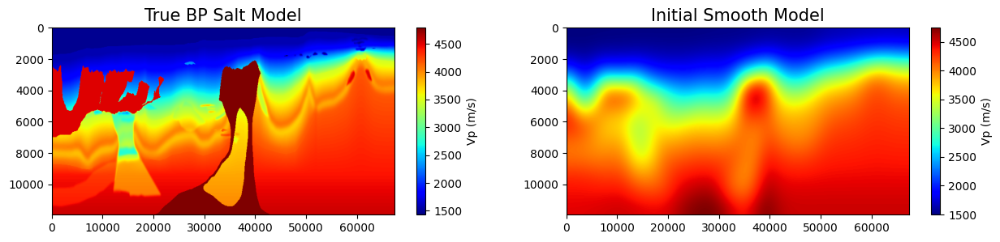


Starting Multiscale FWI...

--- STAGE 1: Frequency = 2.0 Hz ---
  Epoch 50: loss=152.52587


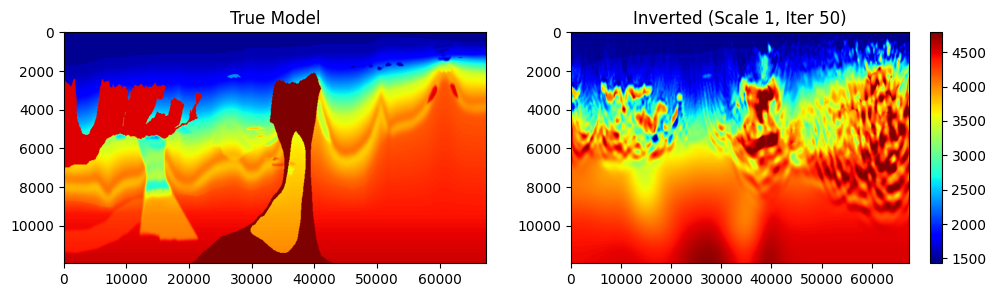

  Epoch 100: loss=18.56496


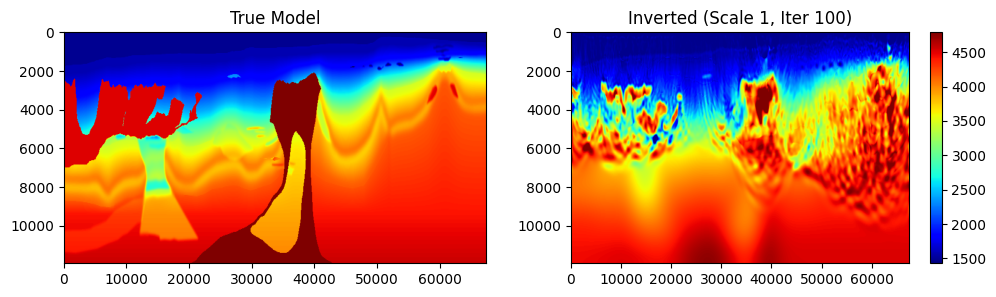


--- STAGE 2: Frequency = 4.0 Hz ---


/usr/local/lib/python3.12/dist-packages/deepwave/common.py:1191: UserWarning: At least six grid cells per wavelength is recommended, but at a frequency of 4.0, a minimum non-zero velocity of 1429.000244140625, and a grid cell spacing of 75.0, there are only 4.76.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/deepwave/common.py:1191: UserWarning: At least six grid cells per wavelength is recommended, but at a frequency of 4.0, a minimum non-zero velocity of 1480.0, and a grid cell spacing of 75.0, there are only 4.93.
  warnings.warn(


  Epoch 50: loss=5.20749


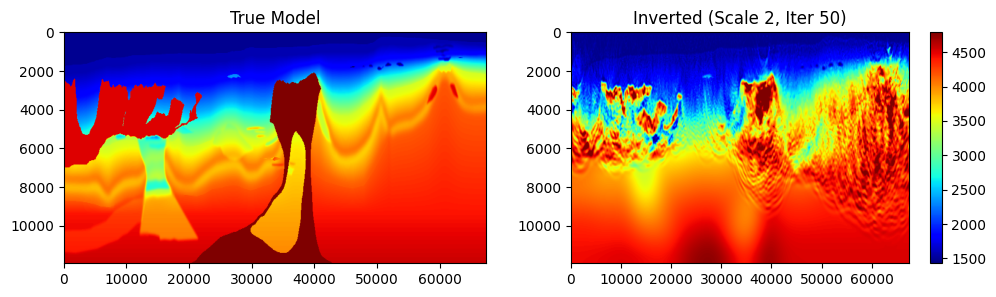

  Epoch 100: loss=1.98223


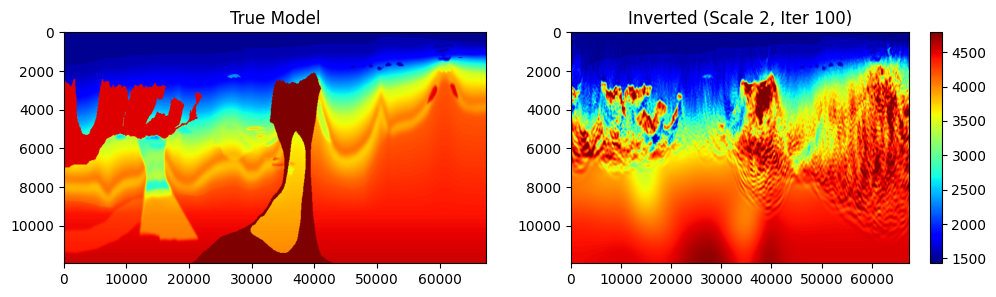


--- STAGE 3: Frequency = 7.0 Hz ---


/usr/local/lib/python3.12/dist-packages/deepwave/common.py:1191: UserWarning: At least six grid cells per wavelength is recommended, but at a frequency of 7.0, a minimum non-zero velocity of 1429.000244140625, and a grid cell spacing of 75.0, there are only 2.72.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/deepwave/common.py:1191: UserWarning: At least six grid cells per wavelength is recommended, but at a frequency of 7.0, a minimum non-zero velocity of 1480.0, and a grid cell spacing of 75.0, there are only 2.82.
  warnings.warn(


  Epoch 50: loss=2.18810


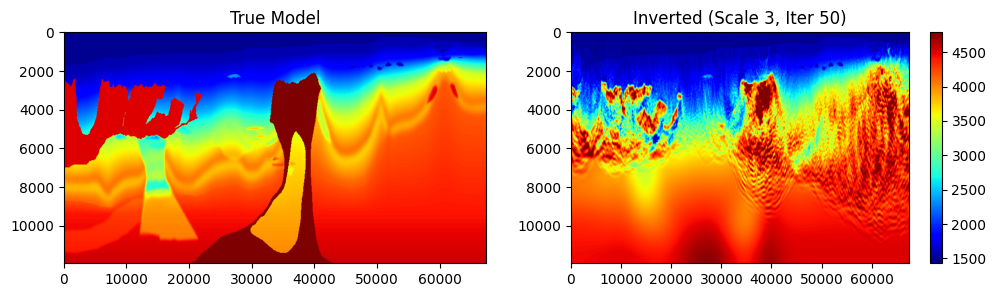

  Epoch 100: loss=1.06972


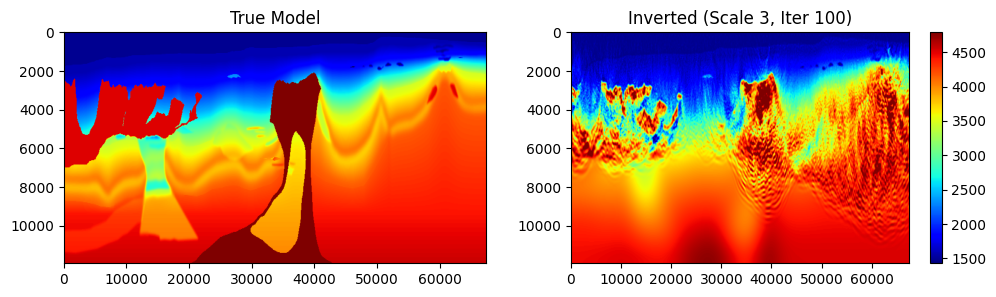

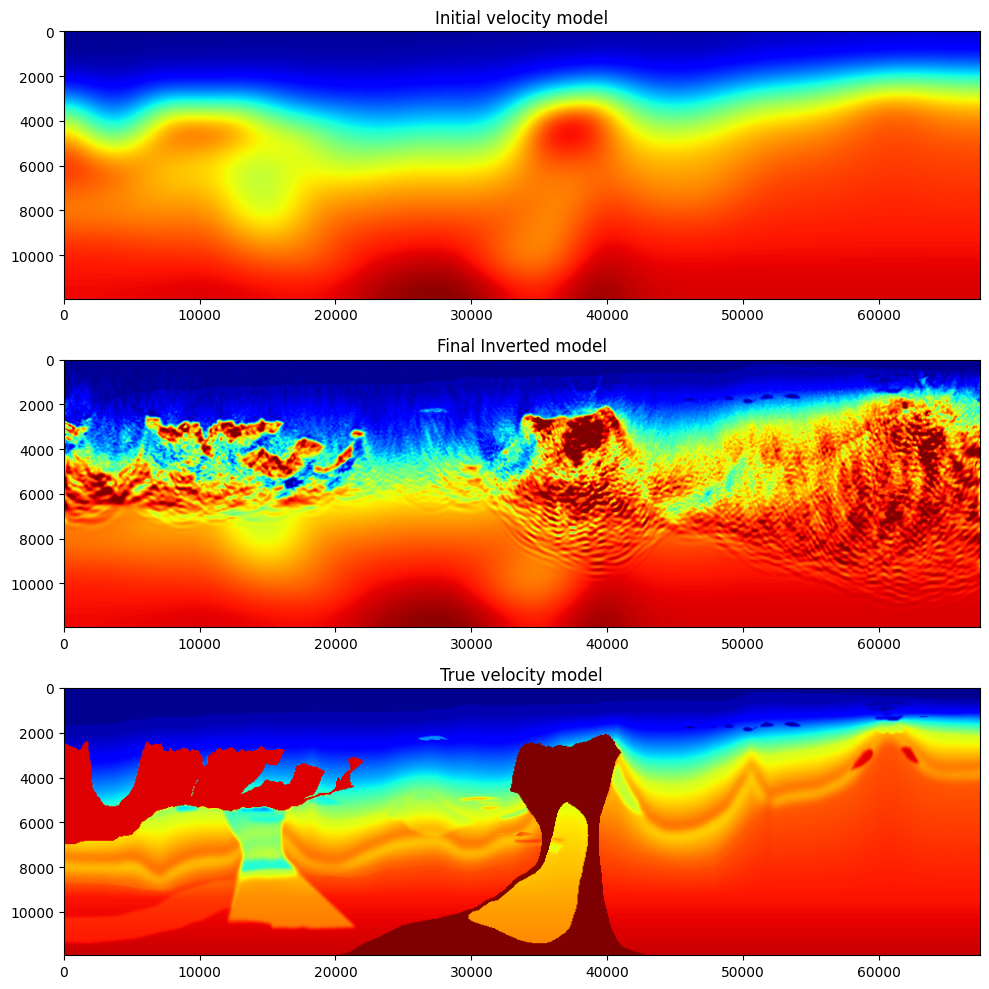

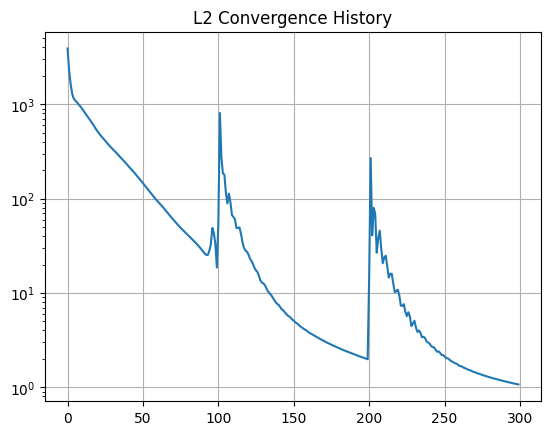

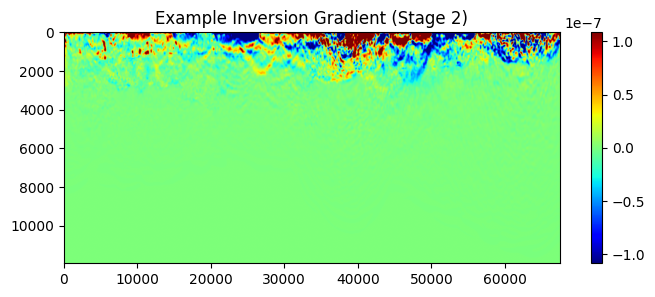

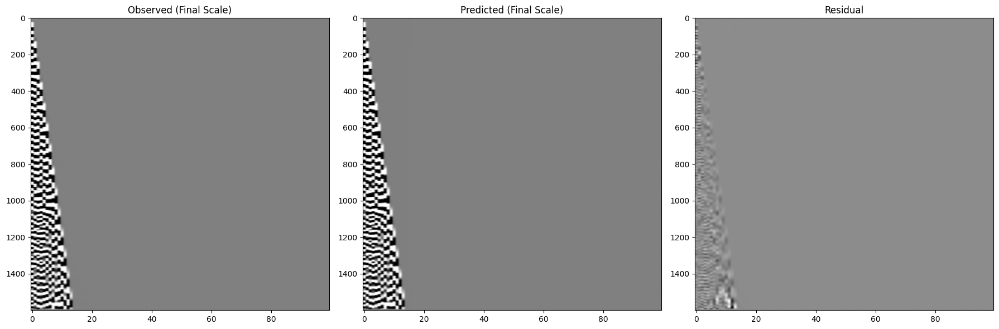

In [ ]:
# LIBRARIES AND SETTINGS
import numpy as np
import torch
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
import deepwave
from deepwave import scalar

# Device: GPU if available, otherwise CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", device)

# 1. INPUT: BP SALT Vp BINARY FILE
# Dimensions based on your SU script: n1=1911 (z), n2=5395 (x)
vp_path = 'bp_salt_vp.bin'
nz0, nx0 = 1911, 5395

# Load and reshape to (nx, nz)
vp = torch.from_file(vp_path, size=nx0 * nz0, dtype=torch.float32).reshape(nx0, nz0).to(device)

# 2. PREPROCESSING: SUBSAMPLE (Factor 6 is optimized for T4 memory)
factor = 6
vp_np = vp.detach().cpu().numpy()
vp_reduced = vp_np[::factor, ::factor]
nx, nz = vp_reduced.shape

dx, dz = 12.5 * factor, 6.26 * factor
spacing = (dx, dz)
extent = [0, (nx-1)*dx, (nz-1)*dz, 0]

# TRUE AND INITIAL MODELS
v_true = torch.from_numpy(vp_reduced).to(device)
v_init = (torch.tensor(1/gaussian_filter(1/v_true.cpu().numpy(), 25)).to(device))
v1 = v_init.clone()
v1.requires_grad_()

print(f"Model shape (nx, nz) = {tuple(v_true.shape)}, dx={dx:.1f}m, dz={dz:.1f}m")

# PLOT TRUE AND INITIAL MODELS
fig1, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 3))
im1 = ax1.imshow(v_true.cpu().T, cmap='jet', aspect='auto', extent=extent)
ax1.set_title('True BP Salt Model', fontsize=15)
im2 = ax2.imshow(v_init.cpu().T, cmap='jet', aspect='auto', extent=extent)
ax2.set_title('Initial Smooth Model', fontsize=15)
fig1.colorbar(im1, ax=ax1, label='Vp (m/s)')
fig1.colorbar(im2, ax=ax2, label='Vp (m/s)')
plt.show()

# 3. MULTISCALE PARAMETERS
# Starting low (2Hz) prevents "blobs", going high (7Hz) adds detail.
frequencies = [2.0, 4.0, 7.0]
iterations_per_scale = [100, 100, 100]
learning_rates = [7e1, 4e1, 2e1]

n_shots = 24
batch_size = 1  # Process 1 shot at a time to save T4 RAM
n_receivers_per_shot = 100
nt, dt = 1600, 0.004
loss_fn = torch.nn.MSELoss()

# Geometry Setup
source_loc = torch.zeros(n_shots, 1, 2, dtype=torch.long, device=device)
source_loc[..., 1] = 2
source_loc[:, 0, 0] = torch.linspace(0, nx - 1, n_shots).round()

receiver_loc = torch.zeros(n_shots, n_receivers_per_shot, 2, dtype=torch.long, device=device)
receiver_loc[..., 1] = 2
receiver_loc[:, :, 0] = torch.linspace(0, nx - 1, n_receivers_per_shot).round()

def taper(x): return deepwave.common.cosine_taper_end(x, 15)

# 4. MULTISCALE INVERSION LOOP
losses = []
gradients = []

print(f"\nStarting Multiscale FWI...")

for scale, freq in enumerate(frequencies):
    print(f"\n--- STAGE {scale+1}: Frequency = {freq} Hz ---")

    # Update wavelet for current scale
    peak_time = 1.5/freq
    source_amp = (deepwave.wavelets.ricker(freq, nt, dt, peak_time)
                  .repeat(n_shots, 1, 1).to(device))

    # Generate fresh observed data for current scale (prevents cycle skipping)
    with torch.no_grad():
        obs_data = torch.zeros(n_shots, n_receivers_per_shot, nt, device=device)
        for i in range(0, n_shots, batch_size):
            out = scalar(v_true, spacing, dt,
                         source_amplitudes=source_amp[i:i+batch_size],
                         source_locations=source_loc[i:i+batch_size],
                         receiver_locations=receiver_loc[i:i+batch_size], pml_freq=freq)
            obs_data[i:i+batch_size] = out[-1]

    obs_tapered = taper(obs_data)
    optimiser = torch.optim.Adam([v1], lr=learning_rates[scale])

    for epoch in range(iterations_per_scale[scale]):
        optimiser.zero_grad()
        epoch_loss = 0.0

        for i in range(0, n_shots, batch_size):
            out_pred = scalar(v1, spacing, dt,
                              source_amplitudes=source_amp[i:i+batch_size],
                              source_locations=source_loc[i:i+batch_size],
                              receiver_locations=receiver_loc[i:i+batch_size], pml_freq=freq)
            loss = loss_fn(taper(out_pred[-1]), obs_tapered[i:i+batch_size])
            (loss / n_shots).backward()
            epoch_loss += loss.item()

        # GRADIENT POST-PROCESSING (Marmousi Reference Logic)
        with torch.no_grad():
            # Adaptive smoothing: more smoothing at low frequencies
            sigma_val = 2.5 / (scale + 1)
            grad_smoothed = gaussian_filter(v1.grad.detach().cpu().numpy(), sigma=sigma_val)
            v1.grad.copy_(torch.tensor(grad_smoothed).to(device))

            # Clipping
            clip_val = torch.quantile(v1.grad.abs(), 0.98)
            torch.nn.utils.clip_grad_value_([v1], clip_val)

        optimiser.step()
        with torch.no_grad(): v1.clamp_(min=1480.0, max=5200.0)

        losses.append(epoch_loss)

        if (epoch + 1) % 50 == 0:
            print(f"  Epoch {epoch+1}: loss={epoch_loss:.5f}")
            fig, ax = plt.subplots(1, 2, figsize=(12, 3))
            ax[0].imshow(v_true.cpu().T, cmap='jet', aspect='auto', extent=extent)
            ax[0].set_title("True Model")
            im = ax[1].imshow(v1.detach().cpu().T, cmap='jet', aspect='auto', extent=extent, vmin=v_true.min(), vmax=v_true.max())
            ax[1].set_title(f"Inverted (Scale {scale+1}, Iter {epoch+1})")
            plt.colorbar(im, ax=ax[1])
            plt.show()

    # Store final gradient of the scale for plotting
    gradients.append(v1.grad.clone().detach().cpu())

# 5. FINAL VISUALIZATIONS
# Generate final predicted data for comparison
with torch.no_grad():
    predicted_data = torch.zeros_like(obs_data)
    for i in range(0, n_shots, batch_size):
        out_f = scalar(v1, spacing, dt, source_amplitudes=source_amp[i:i+batch_size],
                       source_locations=source_loc[i:i+batch_size],
                       receiver_locations=receiver_loc[i:i+batch_size], pml_freq=freq)
        predicted_data[i:i+batch_size] = out_f[-1]

# FINAL VELOCITY COMPARISON (3 Panels)
fig, ax = plt.subplots(3, 1, figsize=(10, 10))
ax[0].imshow(v_init.cpu().T, aspect='auto', cmap='jet', extent=extent, vmin=v_true.min(), vmax=v_true.max())
ax[0].set_title("Initial velocity model")
ax[1].imshow(v1.detach().cpu().T, aspect='auto', cmap='jet', extent=extent, vmin=v_true.min(), vmax=v_true.max())
ax[1].set_title("Final Inverted model")
ax[2].imshow(v_true.cpu().T, aspect='auto', cmap='jet', extent=extent, vmin=v_true.min(), vmax=v_true.max())
ax[2].set_title("True velocity model")
plt.tight_layout(); plt.show()

# LOSS PLOT
plt.figure(); plt.semilogy(losses); plt.title("L2 Convergence History"); plt.grid(); plt.show()

# GRADIENT PLOT (From middle scale)
plt.figure(figsize=(8, 3))
plt.imshow(gradients[1].T, cmap='jet', aspect='auto', extent=extent)
plt.title("Example Inversion Gradient (Stage 2)"); plt.colorbar(); plt.show()

# DATA RESIDUAL PLOT
shot = 0
obs = obs_tapered[shot].detach().cpu()
pred = taper(predicted_data)[shot].detach().cpu()
res = pred - obs
amp = torch.quantile(obs.abs(), 0.95).item()

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(obs.T, aspect="auto", cmap="gray", vmin=-amp, vmax=amp); axes[0].set_title("Observed (Final Scale)")
axes[1].imshow(pred.T, aspect="auto", cmap="gray", vmin=-amp, vmax=amp); axes[1].set_title("Predicted (Final Scale)")
axes[2].imshow(res.T, aspect="auto", cmap="gray"); axes[2].set_title("Residual")
plt.tight_layout(); plt.show()

Device: cuda
Model shape (nx, nz) = (900, 319), dx=75.0m, dz=37.6m


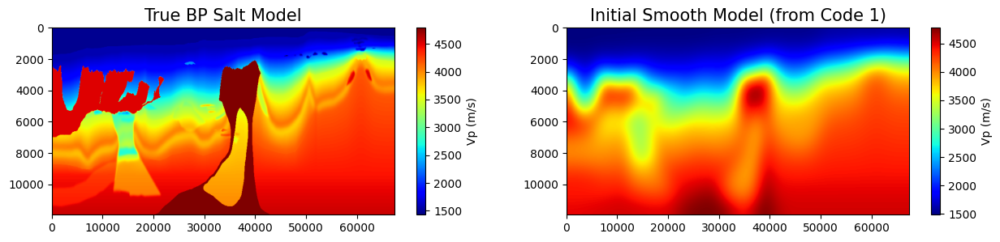


Starting Multiscale FWI...

--- STAGE 1: Frequency = 2.0 Hz ---
  Epoch 50: loss=20.40025


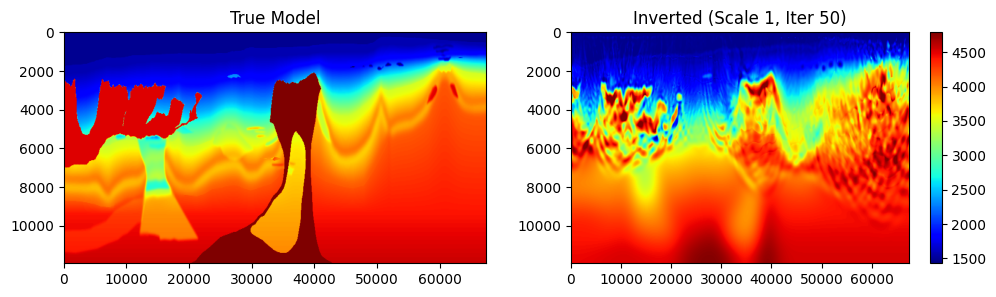

  Epoch 100: loss=3.09564


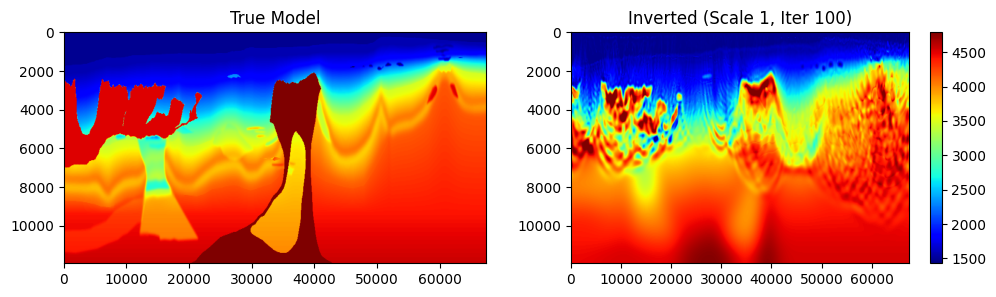


--- STAGE 2: Frequency = 4.0 Hz ---


/usr/local/lib/python3.12/dist-packages/deepwave/common.py:1191: UserWarning: At least six grid cells per wavelength is recommended, but at a frequency of 4.0, a minimum non-zero velocity of 1429.0020751953125, and a grid cell spacing of 75.0, there are only 4.76.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/deepwave/common.py:1191: UserWarning: At least six grid cells per wavelength is recommended, but at a frequency of 4.0, a minimum non-zero velocity of 1480.0, and a grid cell spacing of 75.0, there are only 4.93.
  warnings.warn(


  Epoch 50: loss=4.25516


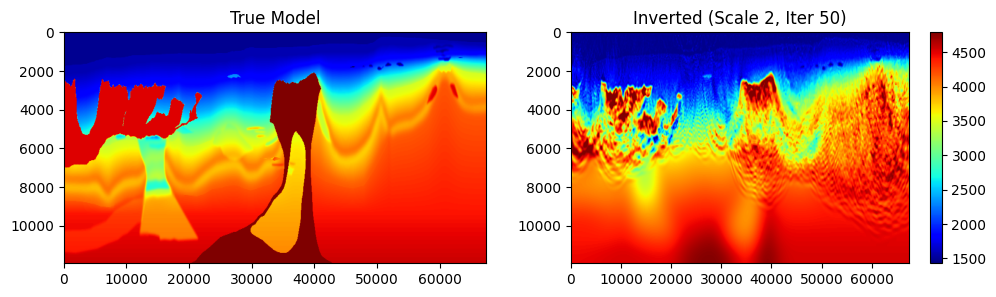

  Epoch 100: loss=1.15336


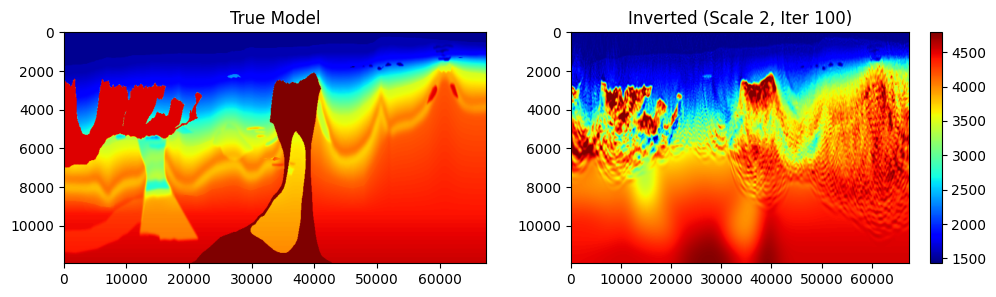


--- STAGE 3: Frequency = 7.0 Hz ---


/usr/local/lib/python3.12/dist-packages/deepwave/common.py:1191: UserWarning: At least six grid cells per wavelength is recommended, but at a frequency of 7.0, a minimum non-zero velocity of 1429.0020751953125, and a grid cell spacing of 75.0, there are only 2.72.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/deepwave/common.py:1191: UserWarning: At least six grid cells per wavelength is recommended, but at a frequency of 7.0, a minimum non-zero velocity of 1480.0, and a grid cell spacing of 75.0, there are only 2.82.
  warnings.warn(


  Epoch 50: loss=1.50267


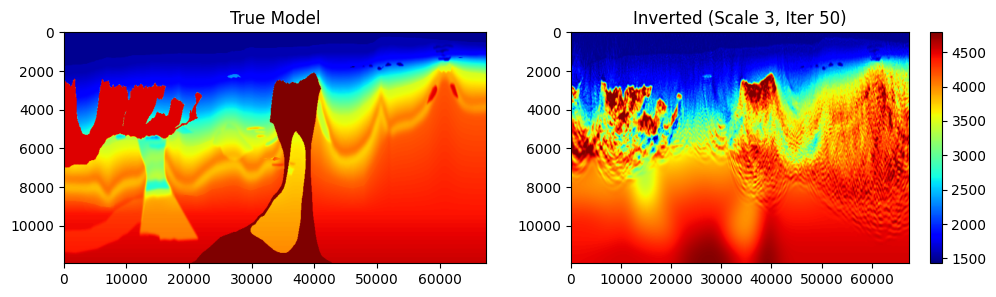

  Epoch 100: loss=0.64181


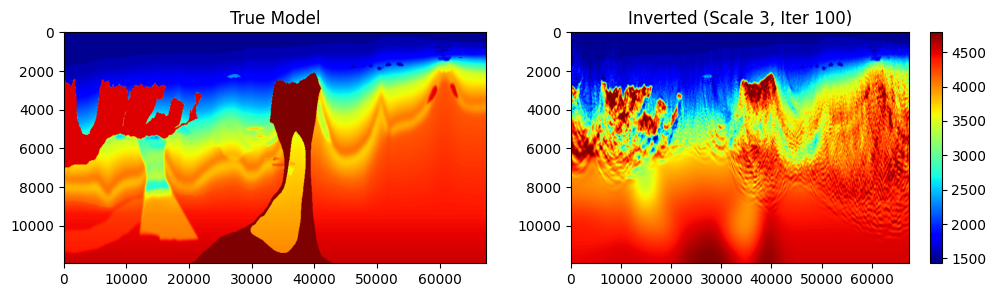

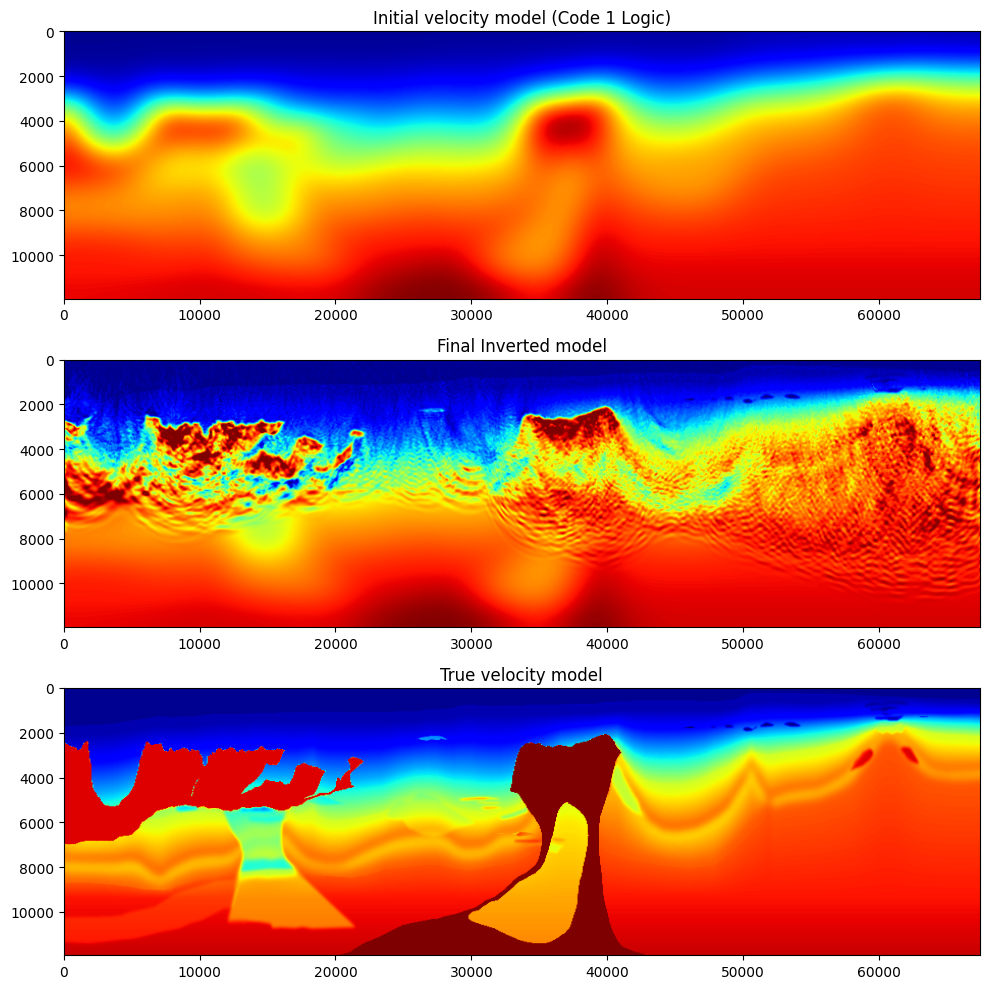

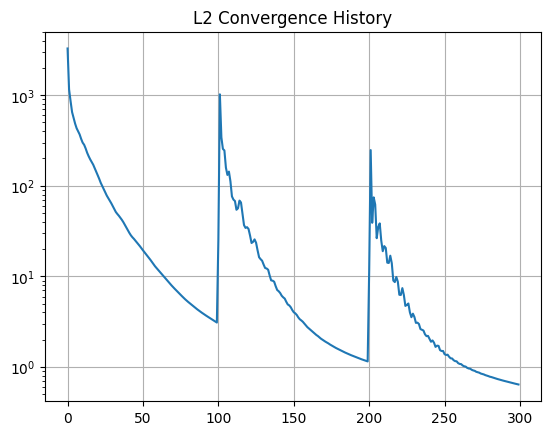

In [ ]:
# LIBRARIES AND SETTINGS
import numpy as np
import torch
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
import deepwave
from deepwave import scalar

# Device: GPU if available, otherwise CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", device)

# 1. INPUT: BP SALT Vp BINARY FILE
# Dimensions based on your SU script: n1=1911 (z), n2=5395 (x)
vp_path = 'bp_salt_vp.bin'
nz0, nx0 = 1911, 5395

# Load and reshape to (nx, nz)
vp = torch.from_file(vp_path, size=nx0 * nz0, dtype=torch.float32).reshape(nx0, nz0).to(device)

# 2. PREPROCESSING: SUBSAMPLE (Updated with Initial Model Logic from Code 1)
factor = 6
vp_np = vp.detach().cpu().numpy()

# Applying sigma=0.5 filter before subsampling (from Code 1)
vp_reduced = gaussian_filter(vp_np, sigma=0.5)[::factor, ::factor]
nx, nz = vp_reduced.shape

dx, dz = 12.5 * factor, 6.26 * factor
spacing = (dx, dz)
extent = [0, (nx-1)*dx, (nz-1)*dz, 0]

# TRUE AND INITIAL MODELS
v_true = torch.from_numpy(vp_reduced).to(device)

# Using Code 1 logic: Reciprocal smoothing with sigma=20
v_init_np = 1.0 / gaussian_filter(1.0 / vp_reduced, sigma=20)
v_init = torch.from_numpy(v_init_np).to(device)

v1 = v_init.clone()
v1.requires_grad_()

print(f"Model shape (nx, nz) = {tuple(v_true.shape)}, dx={dx:.1f}m, dz={dz:.1f}m")

# PLOT TRUE AND INITIAL MODELS
fig1, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 3))
im1 = ax1.imshow(v_true.cpu().T, cmap='jet', aspect='auto', extent=extent)
ax1.set_title('True BP Salt Model', fontsize=15)
im2 = ax2.imshow(v_init.cpu().T, cmap='jet', aspect='auto', extent=extent)
ax2.set_title('Initial Smooth Model (from Code 1)', fontsize=15)
fig1.colorbar(im1, ax=ax1, label='Vp (m/s)')
fig1.colorbar(im2, ax=ax2, label='Vp (m/s)')
plt.show()

# 3. MULTISCALE PARAMETERS
frequencies = [2.0, 4.0, 7.0]
iterations_per_scale = [100, 100, 100]
learning_rates = [7e1, 4e1, 2e1]

n_shots = 24
batch_size = 1  # Process 1 shot at a time to save T4 RAM
n_receivers_per_shot = 100
nt, dt = 1600, 0.004
loss_fn = torch.nn.MSELoss()

# Geometry Setup
source_loc = torch.zeros(n_shots, 1, 2, dtype=torch.long, device=device)
source_loc[..., 1] = 2
source_loc[:, 0, 0] = torch.linspace(0, nx - 1, n_shots).round()

receiver_loc = torch.zeros(n_shots, n_receivers_per_shot, 2, dtype=torch.long, device=device)
receiver_loc[..., 1] = 2
receiver_loc[:, :, 0] = torch.linspace(0, nx - 1, n_receivers_per_shot).round()

def taper(x): return deepwave.common.cosine_taper_end(x, 15)

# 4. MULTISCALE INVERSION LOOP
losses = []
gradients = []

print(f"\nStarting Multiscale FWI...")

for scale, freq in enumerate(frequencies):
    print(f"\n--- STAGE {scale+1}: Frequency = {freq} Hz ---")

    peak_time = 1.5/freq
    source_amp = (deepwave.wavelets.ricker(freq, nt, dt, peak_time)
                  .repeat(n_shots, 1, 1).to(device))

    with torch.no_grad():
        obs_data = torch.zeros(n_shots, n_receivers_per_shot, nt, device=device)
        for i in range(0, n_shots, batch_size):
            out = scalar(v_true, spacing, dt,
                         source_amplitudes=source_amp[i:i+batch_size],
                         source_locations=source_loc[i:i+batch_size],
                         receiver_locations=receiver_loc[i:i+batch_size], pml_freq=freq)
            obs_data[i:i+batch_size] = out[-1]

    obs_tapered = taper(obs_data)
    optimiser = torch.optim.Adam([v1], lr=learning_rates[scale])

    for epoch in range(iterations_per_scale[scale]):
        optimiser.zero_grad()
        epoch_loss = 0.0

        for i in range(0, n_shots, batch_size):
            out_pred = scalar(v1, spacing, dt,
                              source_amplitudes=source_amp[i:i+batch_size],
                              source_locations=source_loc[i:i+batch_size],
                              receiver_locations=receiver_loc[i:i+batch_size], pml_freq=freq)
            loss = loss_fn(taper(out_pred[-1]), obs_tapered[i:i+batch_size])
            (loss / n_shots).backward()
            epoch_loss += loss.item()

        with torch.no_grad():
            sigma_val = 2.5 / (scale + 1)
            grad_smoothed = gaussian_filter(v1.grad.detach().cpu().numpy(), sigma=sigma_val)
            v1.grad.copy_(torch.tensor(grad_smoothed).to(device))

            clip_val = torch.quantile(v1.grad.abs(), 0.98)
            torch.nn.utils.clip_grad_value_([v1], clip_val)

        optimiser.step()
        with torch.no_grad(): v1.clamp_(min=1480.0, max=5200.0)

        losses.append(epoch_loss)

        if (epoch + 1) % 50 == 0:
            print(f"  Epoch {epoch+1}: loss={epoch_loss:.5f}")
            fig, ax = plt.subplots(1, 2, figsize=(12, 3))
            ax[0].imshow(v_true.cpu().T, cmap='jet', aspect='auto', extent=extent)
            ax[0].set_title("True Model")
            im = ax[1].imshow(v1.detach().cpu().T, cmap='jet', aspect='auto', extent=extent, vmin=v_true.min(), vmax=v_true.max())
            ax[1].set_title(f"Inverted (Scale {scale+1}, Iter {epoch+1})")
            plt.colorbar(im, ax=ax[1])
            plt.show()

    gradients.append(v1.grad.clone().detach().cpu())

# 5. FINAL VISUALIZATIONS
with torch.no_grad():
    predicted_data = torch.zeros_like(obs_data)
    for i in range(0, n_shots, batch_size):
        out_f = scalar(v1, spacing, dt, source_amplitudes=source_amp[i:i+batch_size],
                       source_locations=source_loc[i:i+batch_size],
                       receiver_locations=receiver_loc[i:i+batch_size], pml_freq=freq)
        predicted_data[i:i+batch_size] = out_f[-1]

fig, ax = plt.subplots(3, 1, figsize=(10, 10))
ax[0].imshow(v_init.cpu().T, aspect='auto', cmap='jet', extent=extent, vmin=v_true.min(), vmax=v_true.max())
ax[0].set_title("Initial velocity model (Code 1 Logic)")
ax[1].imshow(v1.detach().cpu().T, aspect='auto', cmap='jet', extent=extent, vmin=v_true.min(), vmax=v_true.max())
ax[1].set_title("Final Inverted model")
ax[2].imshow(v_true.cpu().T, aspect='auto', cmap='jet', extent=extent, vmin=v_true.min(), vmax=v_true.max())
ax[2].set_title("True velocity model")
plt.tight_layout(); plt.show()

plt.figure(); plt.semilogy(losses); plt.title("L2 Convergence History"); plt.grid(); plt.show()

Device: cuda
Model shape (nx, nz) = (801, 187), dx=dz=25.0 m
Velocity range (true): 2365.1–6000.0 m/s
Velocity range (init): 2856.2–5999.0 m/s


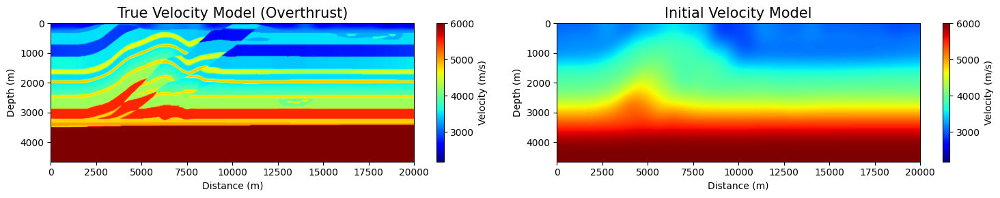

Generating observed data...


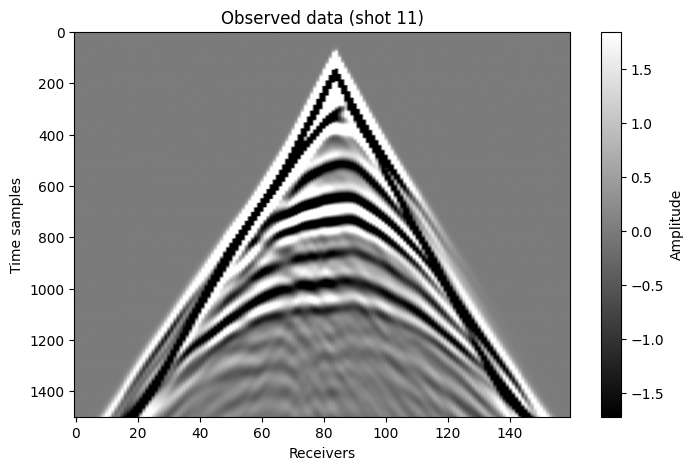

Starting Inversion Loop...


OutOfMemoryError: CUDA out of memory. Tried to allocate 21.82 GiB. GPU 0 has a total capacity of 14.56 GiB of which 14.30 GiB is free. Including non-PyTorch memory, this process has 268.00 MiB memory in use. Of the allocated memory 110.79 MiB is allocated by PyTorch, and 31.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [2]:
# !pip install deepwave  # Run this if deepwave is not installed

# LIBRARIES AND SETTINGS
import numpy as np
import torch
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
import deepwave
from deepwave import scalar           # 2-D acoustic wave propagation

# Device: GPU if available, otherwise CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", device)

# 1. INPUT: OVERTHRUST VP BINARY FILE
vp_path = 'overthrust2D'
nx, nz = 801, 187  # Dimensions from your shell script

# Load binary (Float32)
# We reshape to (nx, nz). Based on n1=187 (depth), n2=801 (distance)
v_true = torch.from_file(vp_path, size=nx * nz, dtype=torch.float32).reshape(nx, nz).to(device)

# Grid spacing from your script (0.025 km = 25 m)
dx = 25.0
dz = 25.0
spacing = (dx, dz)

# Extent for imshow [x_min, x_max, z_max, z_min]
extent = [0, (nx - 1) * dx, (nz - 1) * dz, 0]

# 2. INITIAL VELOCITY MODEL
# Smooth slowness then invert back to velocity
v_init = (torch.tensor(1/gaussian_filter(1/v_true.cpu().numpy(), sigma=15))
          .to(device))

# Variable updated during inversion
v1 = v_init.clone()

print(f"Model shape (nx, nz) = {tuple(v_true.shape)}, dx=dz={dx:.1f} m")
print(f"Velocity range (true): {v_true.min().item():.1f}–{v_true.max().item():.1f} m/s")
print(f"Velocity range (init): {v_init.min().item():.1f}–{v_init.max().item():.1f} m/s")

# PLOT TRUE AND INITIAL VELOCITY MODELS
fig1, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 3))
im1 = ax1.imshow(v_true.cpu().T, cmap='jet', aspect='auto', vmin=2178, vmax=6000, extent=extent)
ax1.set_title('True Velocity Model (Overthrust)', fontsize=15)
ax1.set_xlabel('Distance (m)')
ax1.set_ylabel('Depth (m)')

im2 = ax2.imshow(v_init.cpu().T, cmap='jet', aspect='auto', vmin=2178, vmax=6000, extent=extent)
ax2.set_title('Initial Velocity Model', fontsize=15)
ax2.set_xlabel('Distance (m)')
ax2.set_ylabel('Depth (m)')

fig1.colorbar(im1, ax=ax1, label='Velocity (m/s)')
fig1.colorbar(im2, ax=ax2, label='Velocity (m/s)')
plt.tight_layout()
plt.show()

# 3. ACQUISITION GEOMETRY
n_shots = 20
n_sources_per_shot = 1
source_depth = 2              # grid index

n_receivers_per_shot = 160
receiver_depth = 2            # grid index

# PARAMETERS OF THE WAVELET
freq = 5.0
dt = 0.002               # Reduced dt to 2ms for stability with 6000m/s and 25m dx
nt = 1500                # Number of time samples (3.0 seconds)
peak_time = 1.5/freq

# SOURCE LOCATIONS
source_loc = torch.zeros(n_shots, n_sources_per_shot, 2, dtype=torch.long, device=device)
source_loc[..., 1] = source_depth
source_loc[:, 0, 0] = torch.linspace(0, nx - 1, n_shots).round()

# RECEIVER LOCATIONS
receiver_loc = torch.zeros(n_shots, n_receivers_per_shot, 2, dtype=torch.long, device=device)
receiver_loc[..., 1] = receiver_depth
receiver_loc[:, :, 0] = torch.linspace(0, nx - 1, n_receivers_per_shot).round()

# SOURCE AMPLITUDES (RICKER)
source_amp = (deepwave.wavelets.ricker(freq, nt, dt, peak_time)
              .repeat(n_shots, n_sources_per_shot, 1).to(device))

# 4. FORWARD MODELLING (OBSERVED DATA)
print("Generating observed data...")
out_obs = scalar(v_true, spacing, dt, source_amplitudes=source_amp,
                 source_locations=source_loc, receiver_locations=receiver_loc,
                 accuracy=4, pml_freq=freq)
observed_data = out_obs[-1]

# PLOT OBSERVED DATA FOR ONE SHOT
shot_idx = n_shots // 2
obs_plot = observed_data[shot_idx].cpu()
amin, amax = torch.quantile(obs_plot, torch.tensor([0.05, 0.95]))
plt.figure(figsize=(8, 5))
plt.imshow(obs_plot.T, cmap='gray', aspect='auto', vmin=amin, vmax=amax)
plt.xlabel('Receivers'); plt.ylabel('Time samples')
plt.colorbar(label='Amplitude')
plt.title(f'Observed data (shot {shot_idx + 1})')
plt.show()

# 5. INVERSION SETUP
def taper(x, n_taper=10):
    return deepwave.common.cosine_taper_end(x, n_taper)

observed_data_tapered = taper(observed_data)
v1.requires_grad_()
loss_fn = torch.nn.MSELoss()
optimiser = torch.optim.Adam([v1], lr=20.0)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimiser, milestones=[100, 200], gamma=0.5)

# 6. OPTIMIZATION LOOP
n_epochs = 300
losses = []
gradients = []
vmin, vmax = 2178.0, 6000.0

print("Starting Inversion Loop...")
for epoch in range(n_epochs):
    optimiser.zero_grad()
    out_pred = scalar(v1, spacing, dt,
                      source_amplitudes=source_amp,
                      source_locations=source_loc,
                      receiver_locations=receiver_loc,
                      accuracy=4, pml_freq=freq)
    pred_data = out_pred[-1]

    loss = loss_fn(taper(pred_data), observed_data_tapered)
    loss.backward()

    # Gradient Post-processing
    with torch.no_grad():
        grad = v1.grad.detach().cpu().numpy()
        grad_smoothed = gaussian_filter(grad, sigma=1.5)
        v1.grad.copy_(torch.tensor(grad_smoothed).to(device))
        clip_value = torch.quantile(v1.grad.abs(), 0.98)
        torch.nn.utils.clip_grad_value_([v1], clip_value)

    optimiser.step()
    scheduler.step()

    # Enforce physical bounds
    with torch.no_grad():
        v1.clamp_(min=vmin, max=vmax)

    losses.append(loss.item())

    # Save gradient periodically for visualization (saving every 50 to save RAM)
    if (epoch + 1) % 50 == 0 or epoch == 0:
        gradients.append(v1.grad.clone().detach().cpu())
        print(f"Epoch {epoch+1}: loss={loss.item():.5f}, v_min={v1.min().item():.1f}, v_max={v1.max().item():.1f}")

    # Evolution Visualisation
    if (epoch + 1) % 100 == 0:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3))
        ax1.imshow(v_true.cpu().T, vmin=vmin, vmax=vmax, cmap='jet', aspect='auto', extent=extent)
        ax1.set_title('True Velocity')
        im2 = ax2.imshow(v1.detach().cpu().T, vmin=vmin, vmax=vmax, cmap='jet', aspect='auto', extent=extent)
        ax2.set_title(f'Inverted Velocity (Epoch {epoch+1})')
        plt.colorbar(im2, ax=ax2)
        plt.show()

# 7. FINAL RESULTS AND COMPARISONS
with torch.no_grad():
    out_final = scalar(v1, spacing, dt, source_amplitudes=source_amp,
                       source_locations=source_loc, receiver_locations=receiver_loc,
                       accuracy=4, pml_freq=freq)
predicted_data = out_final[-1]

# 3-PANEL MODEL COMPARISON
fig, ax = plt.subplots(3, 1, figsize=(10, 10))
imgs = [v_init.cpu(), v1.detach().cpu(), v_true.cpu()]
titles = ["Initial Velocity", "Inverted Velocity", "True Velocity"]
for i in range(3):
    im = ax[i].imshow(imgs[i].T, aspect='auto', cmap='jet', vmin=vmin, vmax=vmax, extent=extent)
    ax[i].set_title(titles[i])
    fig.colorbar(im, ax=ax[i], label='m/s')
plt.tight_layout()
plt.show()

# LOSS PLOT
plt.figure()
plt.plot(losses)
plt.yscale('log')
plt.title("Evolution of Loss")
plt.xlabel("Epoch"); plt.ylabel("Loss")
plt.grid()
plt.show()

# GRADIENT PLOT (from the middle of inversion)
plt.figure(figsize=(10, 3))
plt.imshow(gradients[-1].T, cmap='jet', aspect='auto', extent=extent)
plt.title("Final Gradient Amplitude")
plt.colorbar()
plt.show()

# DATA RESIDUAL PLOTS
shot = n_shots // 2
obs = observed_data_tapered[shot].detach().cpu()
pred = taper(predicted_data)[shot].detach().cpu()
res = pred - obs
amp = torch.quantile(obs.abs(), 0.95).item()

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(obs.T, aspect="auto", cmap="gray", vmin=-amp, vmax=amp)
axes[0].set_title("Observed Data")
axes[1].imshow(pred.T, aspect="auto", cmap="gray", vmin=-amp, vmax=amp)
axes[1].set_title("Predicted Data")
im2 = axes[2].imshow(res.T, aspect="auto", cmap="gray", vmin=-amp, vmax=amp)
axes[2].set_title("Residual")
plt.colorbar(im2, ax=axes[2])
plt.show()

# ERROR METRICS
mse = torch.mean(res**2).item()
rel = (torch.norm(res) / torch.norm(obs)).item()
print(f"Final Metrics - Shot {shot+1}: MSE={mse:.3e}, RelL2={rel:.3e}")

Device: cuda
Model shape (nx, nz) = (801, 187)
Velocity range: 2365.1–6000.0 m/s


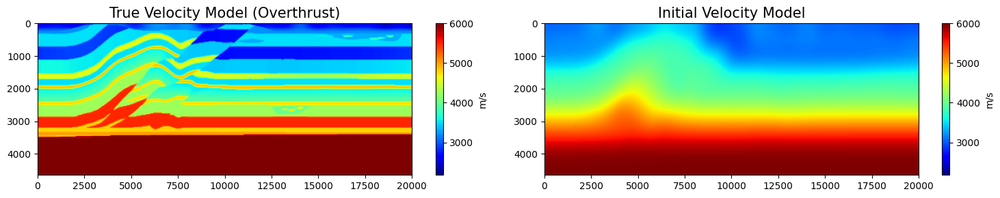

Generating observed data in batches...


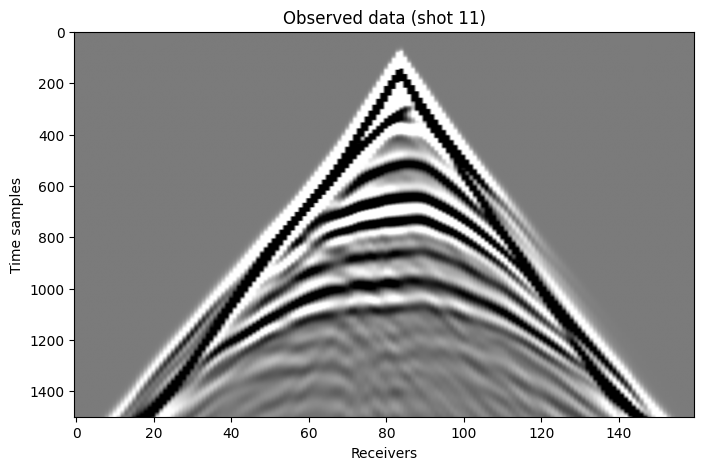

Starting Inversion Loop (Batch size = 2)...
Epoch 50: loss=0.39931, v_min=2227.2, v_max=6000.0


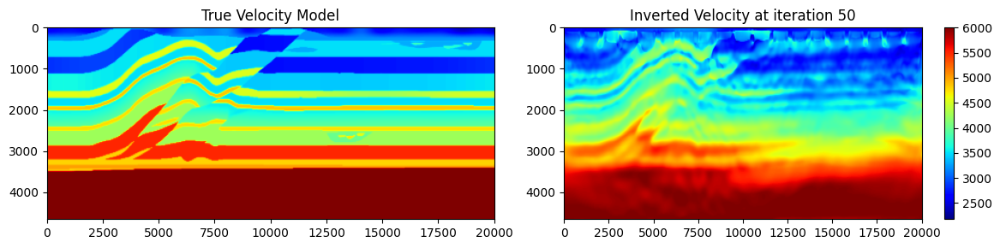

Epoch 100: loss=0.13875, v_min=2230.0, v_max=6000.0


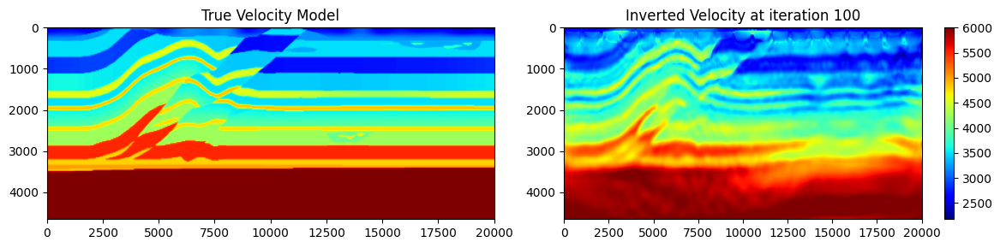

Epoch 150: loss=0.10285, v_min=2178.0, v_max=6000.0


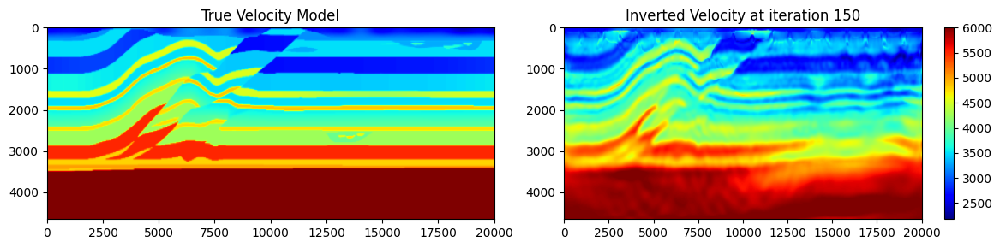

Epoch 200: loss=0.08133, v_min=2178.0, v_max=6000.0


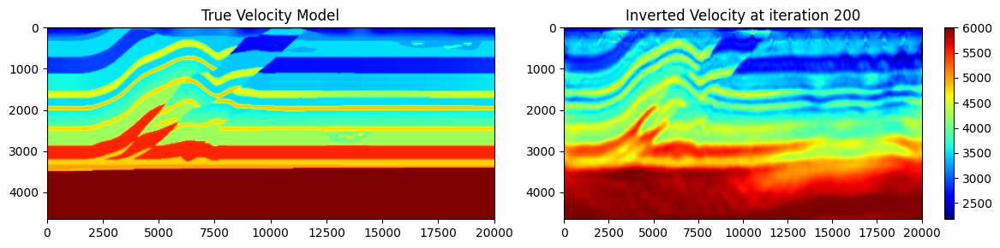

Epoch 250: loss=0.06709, v_min=2178.0, v_max=6000.0


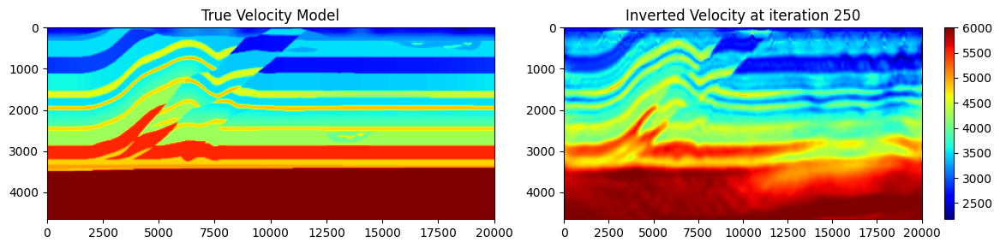

Epoch 300: loss=0.06150, v_min=2178.0, v_max=6000.0


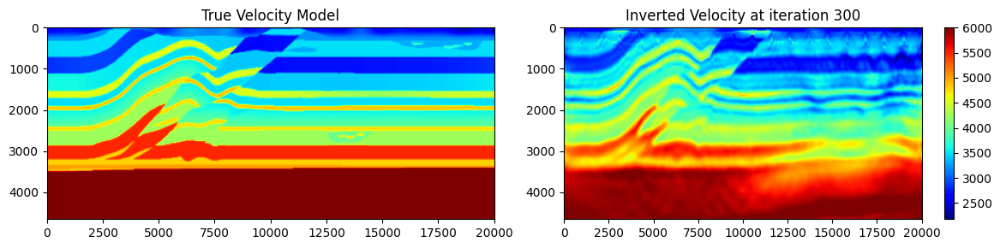

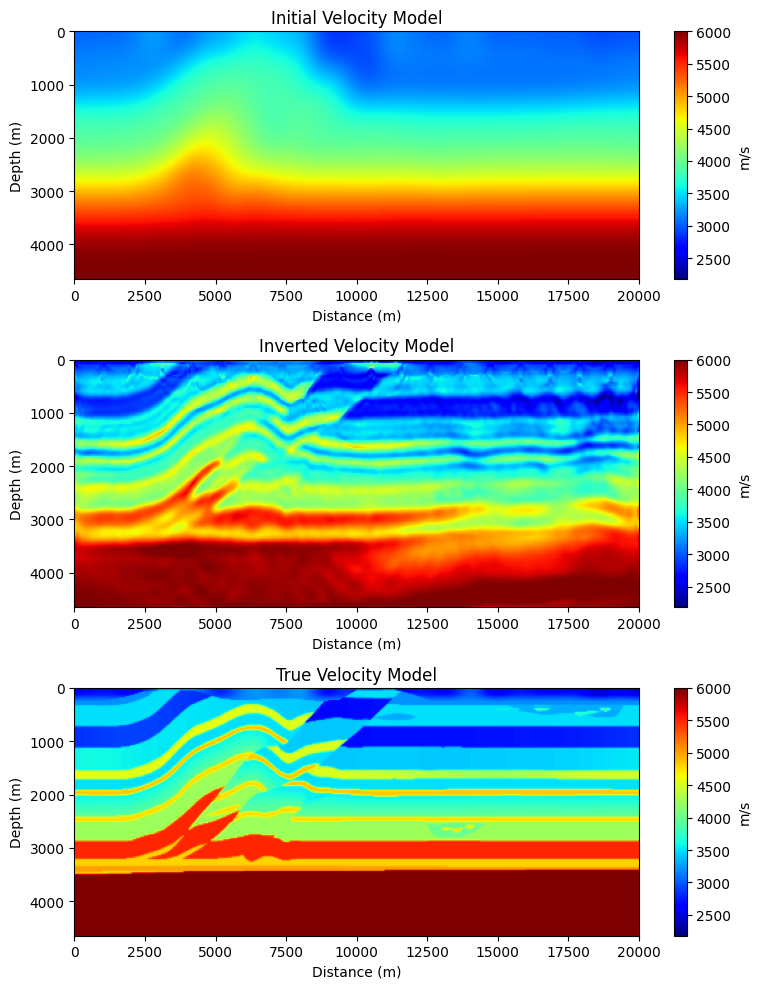

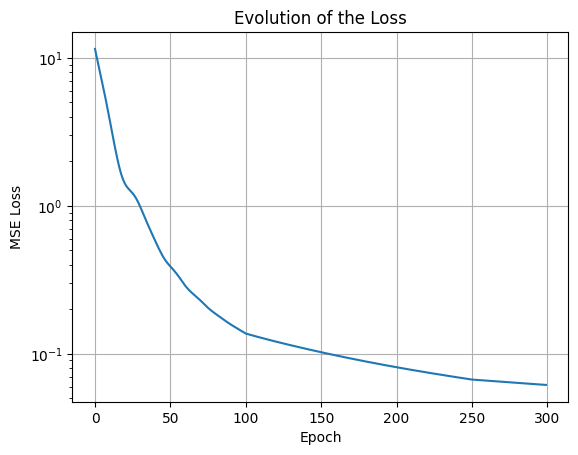

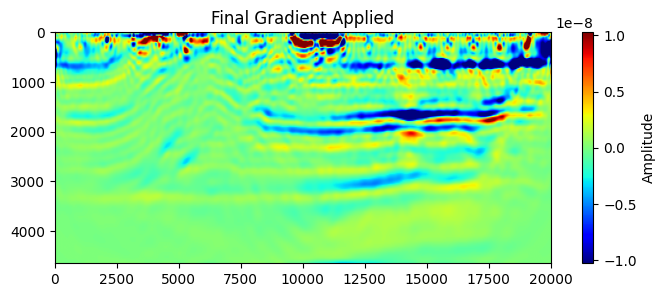

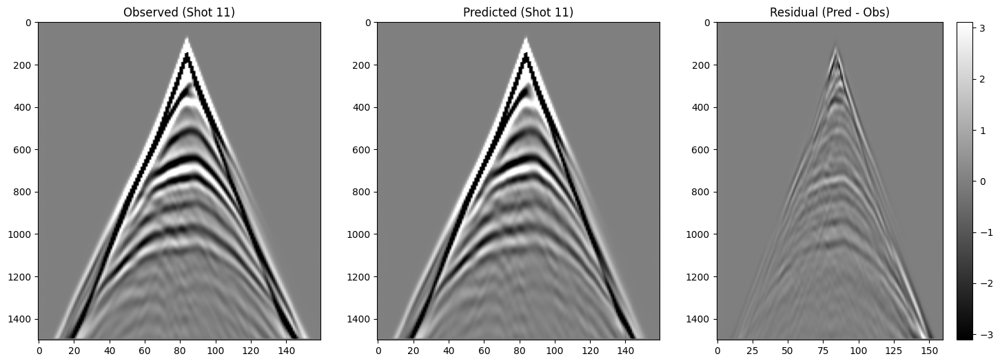

Final Metrics - Shot 11: MSE=6.766e-02, RelL2=8.100e-02


In [4]:
# !pip install deepwave

# LIBRARIES AND SETTINGS
import numpy as np
import torch
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
import deepwave
from deepwave import scalar

# Device: GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", device)

# 1. INPUT: OVERTHRUST VP BINARY FILE
vp_path = 'overthrust2D'
nx, nz = 801, 187

# Load binary (Float32)
v_true = torch.from_file(vp_path, size=nx * nz, dtype=torch.float32).reshape(nx, nz).to(device)

# Grid spacing (25m from your 0.025km script)
dx, dz = 25.0, 25.0
spacing = (dx, dz)
extent = [0, (nx - 1) * dx, (nz - 1) * dz, 0]

# 2. INITIAL VELOCITY MODEL
# Create a smooth starting model
v_init = (torch.tensor(1/gaussian_filter(1/v_true.cpu().numpy(), sigma=15)).to(device))
v1 = v_init.clone()
v1.requires_grad_()

print(f"Model shape (nx, nz) = {tuple(v_true.shape)}")
print(f"Velocity range: {v_true.min().item():.1f}–{v_true.max().item():.1f} m/s")

# PLOT TRUE AND INITIAL VELOCITY MODELS
fig1, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 3))
im1 = ax1.imshow(v_true.cpu().T, cmap='jet', aspect='auto', vmin=2178, vmax=6000, extent=extent)
ax1.set_title('True Velocity Model (Overthrust)', fontsize=15)
im2 = ax2.imshow(v_init.cpu().T, cmap='jet', aspect='auto', vmin=2178, vmax=6000, extent=extent)
ax2.set_title('Initial Velocity Model', fontsize=15)
fig1.colorbar(im1, ax=ax1, label='m/s')
fig1.colorbar(im2, ax=ax2, label='m/s')
plt.tight_layout()
plt.show()

# 3. ACQUISITION GEOMETRY
n_shots = 20
n_sources_per_shot = 1
n_receivers_per_shot = 160
freq = 5.0
dt = 0.002               # 2ms for numerical stability
nt = 1500
peak_time = 1.5/freq

source_loc = torch.zeros(n_shots, n_sources_per_shot, 2, dtype=torch.long, device=device)
source_loc[..., 1] = 2 # Source depth
source_loc[:, 0, 0] = torch.linspace(0, nx - 1, n_shots).round()

receiver_loc = torch.zeros(n_shots, n_receivers_per_shot, 2, dtype=torch.long, device=device)
receiver_loc[..., 1] = 2 # Receiver depth
receiver_loc[:, :, 0] = torch.linspace(0, nx - 1, n_receivers_per_shot).round()

source_amp = (deepwave.wavelets.ricker(freq, nt, dt, peak_time)
              .repeat(n_shots, n_sources_per_shot, 1).to(device))

# 4. FORWARD MODELLING (Generated in small batches to fit in RAM)
print("Generating observed data in batches...")
observed_data = torch.zeros(n_shots, n_receivers_per_shot, nt, device=device)
batch_size = 2 # Small batch size to ensure it fits in 15GB RAM

with torch.no_grad():
    for i in range(0, n_shots, batch_size):
        out = scalar(v_true, spacing, dt,
                     source_amplitudes=source_amp[i:i+batch_size],
                     source_locations=source_loc[i:i+batch_size],
                     receiver_locations=receiver_loc[i:i+batch_size],
                     accuracy=4, pml_freq=freq)
        observed_data[i:i+batch_size] = out[-1]

# PLOT OBSERVED DATA FOR ONE SHOT
shot_idx = n_shots // 2
obs_plot = observed_data[shot_idx].cpu()
amin, amax = torch.quantile(obs_plot, torch.tensor([0.05, 0.95]))
plt.figure(figsize=(8, 5))
plt.imshow(obs_plot.T, cmap='gray', aspect='auto', vmin=amin, vmax=amax)
plt.xlabel('Receivers'); plt.ylabel('Time samples')
plt.title(f'Observed data (shot {shot_idx + 1})')
plt.show()

# 5. INVERSION SETUP
def taper(x, n_taper=10):
    return deepwave.common.cosine_taper_end(x, n_taper)

observed_data_tapered = taper(observed_data)
loss_fn = torch.nn.MSELoss()
optimiser = torch.optim.Adam([v1], lr=20.0)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimiser, milestones=[100, 250], gamma=0.5)

# 6. OPTIMIZATION LOOP
n_epochs = 300
losses = []
gradients = []
vmin_plot, vmax_plot = 2178.0, 6000.0

print("Starting Inversion Loop (Batch size = 2)...")
for epoch in range(n_epochs):
    optimiser.zero_grad()
    epoch_loss = 0

    # Process shots in small batches to keep GPU memory usage low
    for i in range(0, n_shots, batch_size):
        out_pred = scalar(v1, spacing, dt,
                          source_amplitudes=source_amp[i:i+batch_size],
                          source_locations=source_loc[i:i+batch_size],
                          receiver_locations=receiver_loc[i:i+batch_size],
                          accuracy=4, pml_freq=freq)

        pred_batch = out_pred[-1]
        # Calculate loss for this batch
        loss = loss_fn(taper(pred_batch), observed_data_tapered[i:i+batch_size])

        # Scale loss so the gradient is averaged over all shots correctly
        loss = loss / (n_shots / batch_size)
        loss.backward() # Accumulates gradient into v1.grad
        epoch_loss += loss.item()

    # Gradient Post-processing
    with torch.no_grad():
        grad = v1.grad.detach().cpu().numpy()
        grad_smoothed = gaussian_filter(grad, sigma=1.5)
        v1.grad.copy_(torch.tensor(grad_smoothed).to(device))

        # Clip gradient to stabilize inversion
        clip_value = torch.quantile(v1.grad.abs(), 0.98)
        torch.nn.utils.clip_grad_value_([v1], clip_value)

    optimiser.step()
    scheduler.step()

    # Constrain velocity to physical limits
    with torch.no_grad():
        v1.clamp_(min=vmin_plot, max=vmax_plot)

    losses.append(epoch_loss)

    # Visualise progress
    if (epoch + 1) % 50 == 0:
        gradients.append(v1.grad.clone().detach().cpu())
        print(f"Epoch {epoch+1}: loss={epoch_loss:.5f}, v_min={v1.min().item():.1f}, v_max={v1.max().item():.1f}")

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3))
        ax1.imshow(v_true.cpu().T, vmin=vmin_plot, vmax=vmax_plot, cmap='jet', aspect='auto', extent=extent)
        ax1.set_title('True Velocity Model')
        im2 = ax2.imshow(v1.detach().cpu().T, vmin=vmin_plot, vmax=vmax_plot, cmap='jet', aspect='auto', extent=extent)
        ax2.set_title(f'Inverted Velocity at iteration {epoch+1}')
        plt.colorbar(im2, ax=ax2)
        plt.tight_layout()
        plt.show()

# 7. FINAL PREDICTED DATA
with torch.no_grad():
    predicted_data = torch.zeros_like(observed_data)
    for i in range(0, n_shots, batch_size):
        out = scalar(v1, spacing, dt,
                     source_amplitudes=source_amp[i:i+batch_size],
                     source_locations=source_loc[i:i+batch_size],
                     receiver_locations=receiver_loc[i:i+batch_size],
                     accuracy=4, pml_freq=freq)
        predicted_data[i:i+batch_size] = out[-1]

# 8. PLOTTING FINAL RESULTS
fig1, ax1 = plt.subplots(3, figsize=(8, 10))
imgs = [v_init.cpu(), v1.detach().cpu(), v_true.cpu()]
titles = ["Initial Velocity Model", "Inverted Velocity Model", "True Velocity Model"]

for i in range(3):
    im = ax1[i].imshow(imgs[i].T, aspect='auto', cmap='jet', vmin=vmin_plot, vmax=vmax_plot, extent=extent)
    ax1[i].set_title(titles[i])
    ax1[i].set_xlabel("Distance (m)"); ax1[i].set_ylabel("Depth (m)")
    fig1.colorbar(im, ax=ax1[i], label='m/s')
plt.tight_layout()
plt.show()

# LOSS VALUES
plt.figure()
plt.plot(losses); plt.yscale('log')
plt.title("Evolution of the Loss"); plt.xlabel("Epoch"); plt.ylabel("MSE Loss")
plt.grid(); plt.show()

# GRADIENT
plt.figure(figsize=(8, 3))
plt.imshow(gradients[-1].T, cmap='jet', aspect='auto', extent=extent)
plt.title("Final Gradient Applied")
plt.colorbar(label='Amplitude')
plt.show()

# OBSERVED, PREDICTED, AND RESIDUAL
shot = n_shots // 2
obs = observed_data_tapered[shot].detach().cpu()
pred = taper(predicted_data)[shot].detach().cpu()
res = pred - obs
amp = torch.quantile(obs.abs(), 0.95).item()

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(obs.T, aspect="auto", cmap="gray", vmin=-amp, vmax=amp)
axes[0].set_title(f"Observed (Shot {shot+1})")
axes[1].imshow(pred.T, aspect="auto", cmap="gray", vmin=-amp, vmax=amp)
axes[1].set_title(f"Predicted (Shot {shot+1})")
im2 = axes[2].imshow(res.T, aspect="auto", cmap="gray", vmin=-amp, vmax=amp)
axes[2].set_title("Residual (Pred - Obs)")
plt.colorbar(im2, ax=axes[2])
plt.show()

# METRICS
mse = torch.mean(res**2).item()
rel = (torch.norm(res) / torch.norm(obs)).item()
print(f"Final Metrics - Shot {shot+1}: MSE={mse:.3e}, RelL2={rel:.3e}")

Device: cuda
Model shape (nx, nz) = (801, 187)
Velocity range: 2365.1–6000.0 m/s


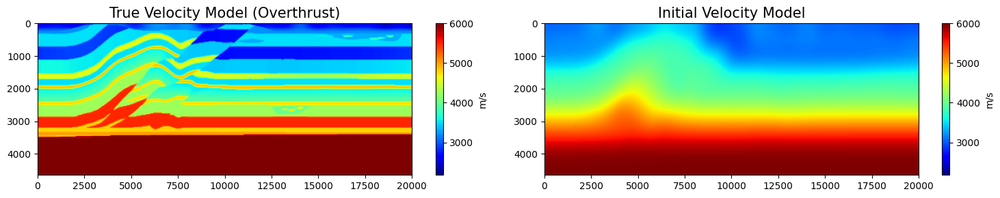

Generating observed data in batches...


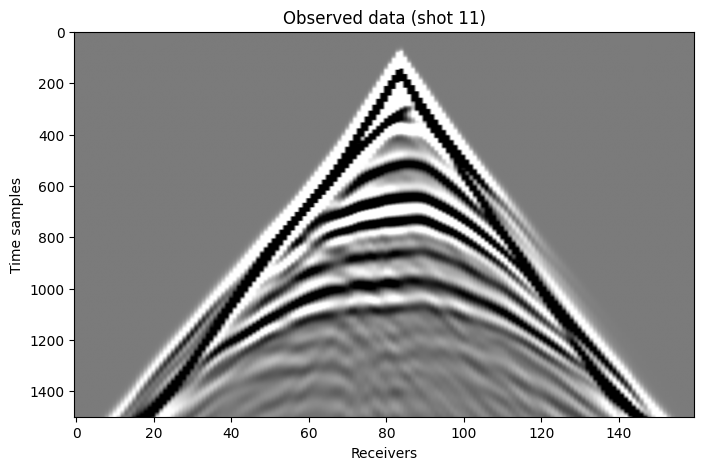

Starting Inversion Loop (Batch size = 2)...
Epoch 100: loss=0.12682, v_min=2224.2, v_max=6000.0


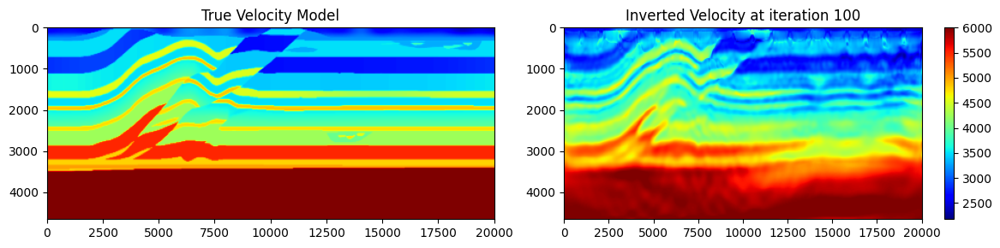

Epoch 200: loss=0.05306, v_min=2178.0, v_max=6000.0


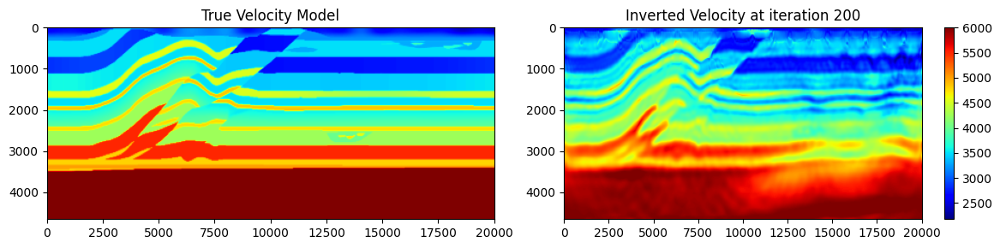

Epoch 300: loss=0.03172, v_min=2189.2, v_max=6000.0


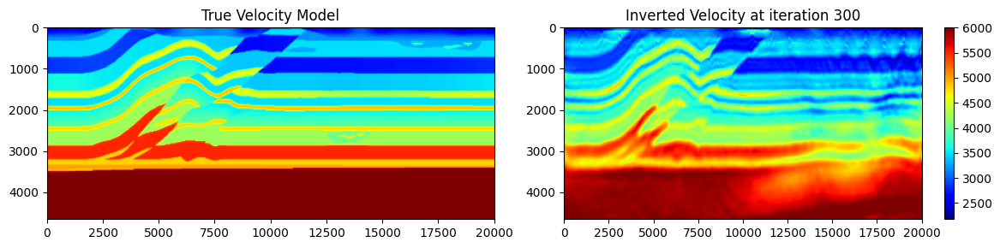

Epoch 400: loss=0.02528, v_min=2205.0, v_max=6000.0


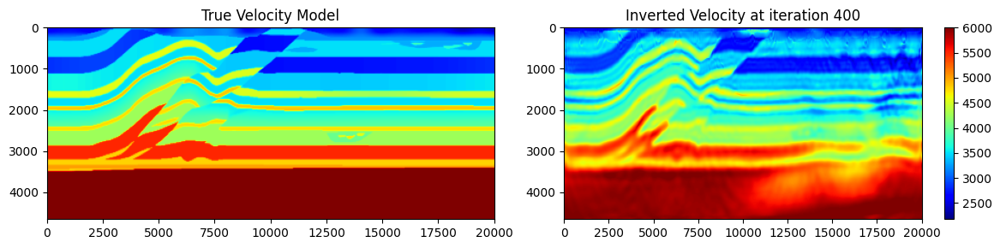

Epoch 500: loss=0.02040, v_min=2211.4, v_max=6000.0


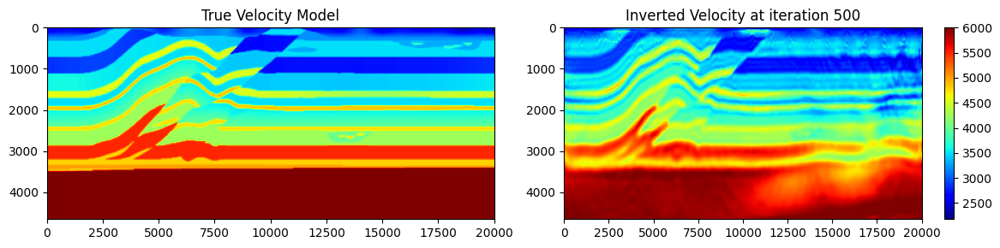

Epoch 600: loss=0.01661, v_min=2219.0, v_max=6000.0


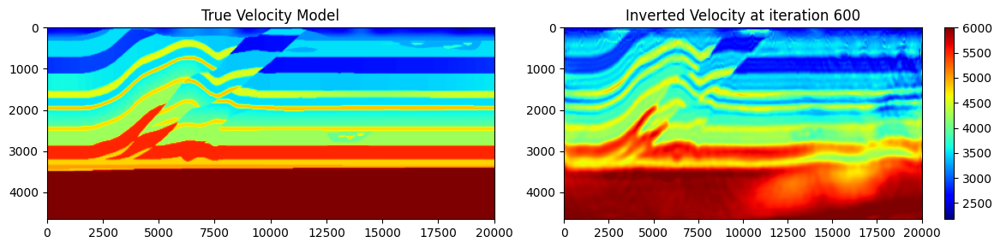

Epoch 700: loss=0.01498, v_min=2223.3, v_max=6000.0


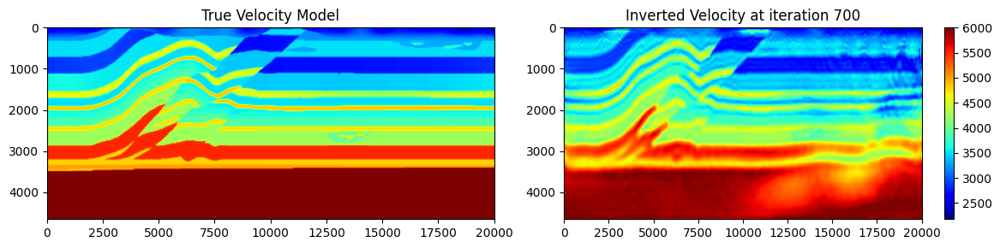

Epoch 800: loss=0.01348, v_min=2227.8, v_max=6000.0


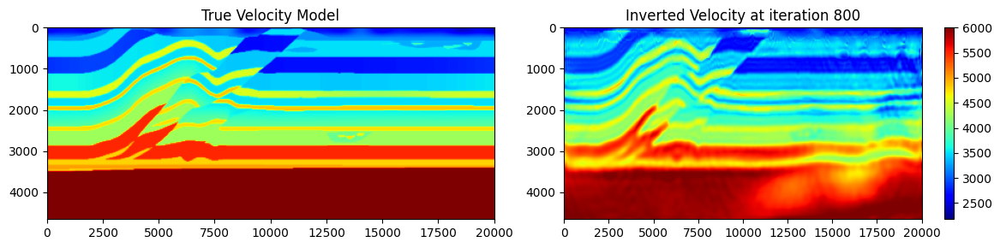

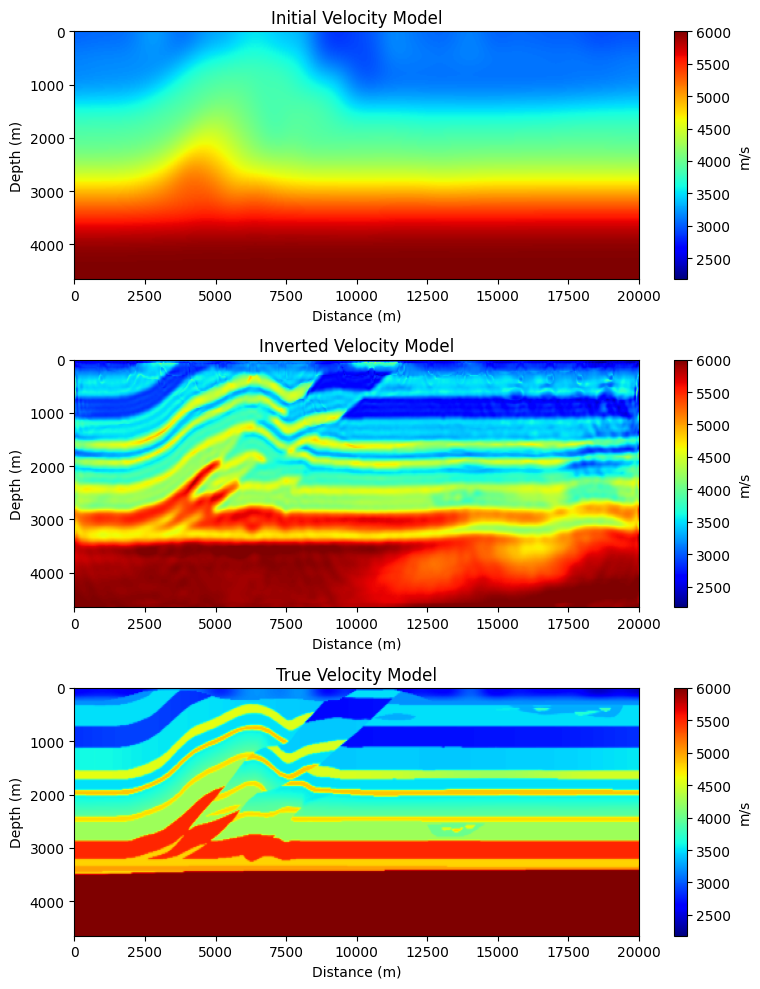

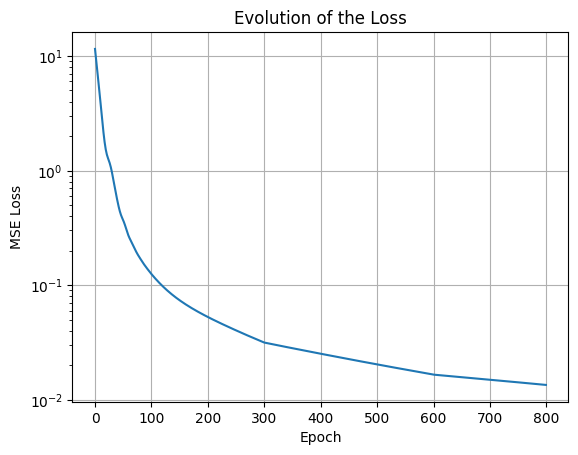

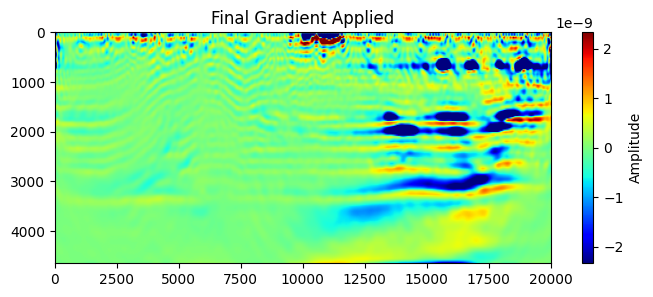

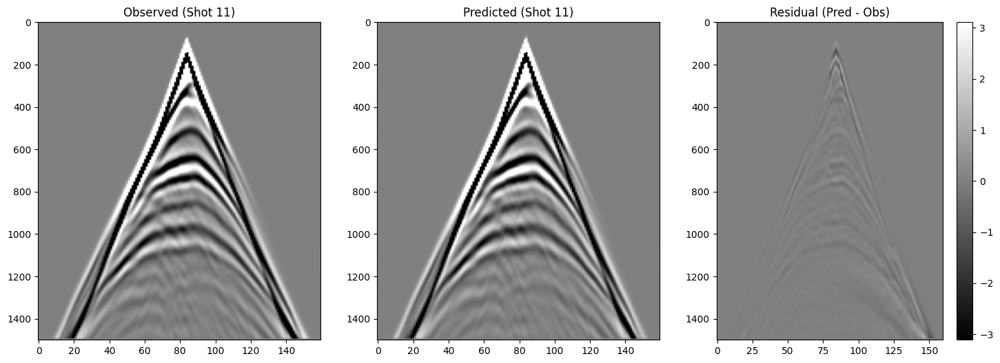

Final Metrics - Shot 11: MSE=8.329e-03, RelL2=2.842e-02


In [6]:
# !pip install deepwave

# LIBRARIES AND SETTINGS
import numpy as np
import torch
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
import deepwave
from deepwave import scalar

# Device: GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", device)

# 1. INPUT: OVERTHRUST VP BINARY FILE
vp_path = 'overthrust2D'
nx, nz = 801, 187

# Load binary (Float32)
v_true = torch.from_file(vp_path, size=nx * nz, dtype=torch.float32).reshape(nx, nz).to(device)

# Grid spacing (25m from your 0.025km script)
dx, dz = 25.0, 25.0
spacing = (dx, dz)
extent = [0, (nx - 1) * dx, (nz - 1) * dz, 0]

# 2. INITIAL VELOCITY MODEL
# Create a smooth starting model
v_init = (torch.tensor(1/gaussian_filter(1/v_true.cpu().numpy(), sigma=15)).to(device))
v1 = v_init.clone()
v1.requires_grad_()

print(f"Model shape (nx, nz) = {tuple(v_true.shape)}")
print(f"Velocity range: {v_true.min().item():.1f}–{v_true.max().item():.1f} m/s")

# PLOT TRUE AND INITIAL VELOCITY MODELS
fig1, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 3))
im1 = ax1.imshow(v_true.cpu().T, cmap='jet', aspect='auto', vmin=2178, vmax=6000, extent=extent)
ax1.set_title('True Velocity Model (Overthrust)', fontsize=15)
im2 = ax2.imshow(v_init.cpu().T, cmap='jet', aspect='auto', vmin=2178, vmax=6000, extent=extent)
ax2.set_title('Initial Velocity Model', fontsize=15)
fig1.colorbar(im1, ax=ax1, label='m/s')
fig1.colorbar(im2, ax=ax2, label='m/s')
plt.tight_layout()
plt.show()

# 3. ACQUISITION GEOMETRY
n_shots = 20
n_sources_per_shot = 1
n_receivers_per_shot = 160
freq = 5.0
dt = 0.002               # 2ms for numerical stability
nt = 1500
peak_time = 1.5/freq

source_loc = torch.zeros(n_shots, n_sources_per_shot, 2, dtype=torch.long, device=device)
source_loc[..., 1] = 2 # Source depth
source_loc[:, 0, 0] = torch.linspace(0, nx - 1, n_shots).round()

receiver_loc = torch.zeros(n_shots, n_receivers_per_shot, 2, dtype=torch.long, device=device)
receiver_loc[..., 1] = 2 # Receiver depth
receiver_loc[:, :, 0] = torch.linspace(0, nx - 1, n_receivers_per_shot).round()

source_amp = (deepwave.wavelets.ricker(freq, nt, dt, peak_time)
              .repeat(n_shots, n_sources_per_shot, 1).to(device))

# 4. FORWARD MODELLING (Generated in small batches to fit in RAM)
print("Generating observed data in batches...")
observed_data = torch.zeros(n_shots, n_receivers_per_shot, nt, device=device)
batch_size = 2 # Small batch size to ensure it fits in 15GB RAM

with torch.no_grad():
    for i in range(0, n_shots, batch_size):
        out = scalar(v_true, spacing, dt,
                     source_amplitudes=source_amp[i:i+batch_size],
                     source_locations=source_loc[i:i+batch_size],
                     receiver_locations=receiver_loc[i:i+batch_size],
                     accuracy=4, pml_freq=freq)
        observed_data[i:i+batch_size] = out[-1]

# PLOT OBSERVED DATA FOR ONE SHOT
shot_idx = n_shots // 2
obs_plot = observed_data[shot_idx].cpu()
amin, amax = torch.quantile(obs_plot, torch.tensor([0.05, 0.95]))
plt.figure(figsize=(8, 5))
plt.imshow(obs_plot.T, cmap='gray', aspect='auto', vmin=amin, vmax=amax)
plt.xlabel('Receivers'); plt.ylabel('Time samples')
plt.title(f'Observed data (shot {shot_idx + 1})')
plt.show()

# 5. INVERSION SETUP
def taper(x, n_taper=10):
    return deepwave.common.cosine_taper_end(x, n_taper)

observed_data_tapered = taper(observed_data)
loss_fn = torch.nn.MSELoss()
optimiser = torch.optim.Adam([v1], lr=20.0)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimiser, milestones=[300, 600], gamma=0.5)

# 6. OPTIMIZATION LOOP
n_epochs = 800
losses = []
gradients = []
vmin_plot, vmax_plot = 2178.0, 6000.0

print("Starting Inversion Loop (Batch size = 2)...")
for epoch in range(n_epochs):
    optimiser.zero_grad()
    epoch_loss = 0

    # Process shots in small batches to keep GPU memory usage low
    for i in range(0, n_shots, batch_size):
        out_pred = scalar(v1, spacing, dt,
                          source_amplitudes=source_amp[i:i+batch_size],
                          source_locations=source_loc[i:i+batch_size],
                          receiver_locations=receiver_loc[i:i+batch_size],
                          accuracy=4, pml_freq=freq)

        pred_batch = out_pred[-1]
        # Calculate loss for this batch
        loss = loss_fn(taper(pred_batch), observed_data_tapered[i:i+batch_size])

        # Scale loss so the gradient is averaged over all shots correctly
        loss = loss / (n_shots / batch_size)
        loss.backward() # Accumulates gradient into v1.grad
        epoch_loss += loss.item()

    # Gradient Post-processing
    with torch.no_grad():
        grad = v1.grad.detach().cpu().numpy()
        grad_smoothed = gaussian_filter(grad, sigma=1.2)
        v1.grad.copy_(torch.tensor(grad_smoothed).to(device))

        # Clip gradient to stabilize inversion
        clip_value = torch.quantile(v1.grad.abs(), 0.98)
        torch.nn.utils.clip_grad_value_([v1], clip_value)

    optimiser.step()
    scheduler.step()

    # Constrain velocity to physical limits
    with torch.no_grad():
        v1.clamp_(min=vmin_plot, max=vmax_plot)

    losses.append(epoch_loss)

    # Visualise progress
    if (epoch + 1) % 100 == 0:
        gradients.append(v1.grad.clone().detach().cpu())
        print(f"Epoch {epoch+1}: loss={epoch_loss:.5f}, v_min={v1.min().item():.1f}, v_max={v1.max().item():.1f}")

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3))
        ax1.imshow(v_true.cpu().T, vmin=vmin_plot, vmax=vmax_plot, cmap='jet', aspect='auto', extent=extent)
        ax1.set_title('True Velocity Model')
        im2 = ax2.imshow(v1.detach().cpu().T, vmin=vmin_plot, vmax=vmax_plot, cmap='jet', aspect='auto', extent=extent)
        ax2.set_title(f'Inverted Velocity at iteration {epoch+1}')
        plt.colorbar(im2, ax=ax2)
        plt.tight_layout()
        plt.show()

# 7. FINAL PREDICTED DATA
with torch.no_grad():
    predicted_data = torch.zeros_like(observed_data)
    for i in range(0, n_shots, batch_size):
        out = scalar(v1, spacing, dt,
                     source_amplitudes=source_amp[i:i+batch_size],
                     source_locations=source_loc[i:i+batch_size],
                     receiver_locations=receiver_loc[i:i+batch_size],
                     accuracy=4, pml_freq=freq)
        predicted_data[i:i+batch_size] = out[-1]

# 8. PLOTTING FINAL RESULTS
fig1, ax1 = plt.subplots(3, figsize=(8, 10))
imgs = [v_init.cpu(), v1.detach().cpu(), v_true.cpu()]
titles = ["Initial Velocity Model", "Inverted Velocity Model", "True Velocity Model"]

for i in range(3):
    im = ax1[i].imshow(imgs[i].T, aspect='auto', cmap='jet', vmin=vmin_plot, vmax=vmax_plot, extent=extent)
    ax1[i].set_title(titles[i])
    ax1[i].set_xlabel("Distance (m)"); ax1[i].set_ylabel("Depth (m)")
    fig1.colorbar(im, ax=ax1[i], label='m/s')
plt.tight_layout()
plt.show()

# LOSS VALUES
plt.figure()
plt.plot(losses); plt.yscale('log')
plt.title("Evolution of the Loss"); plt.xlabel("Epoch"); plt.ylabel("MSE Loss")
plt.grid(); plt.show()

# GRADIENT
plt.figure(figsize=(8, 3))
plt.imshow(gradients[-1].T, cmap='jet', aspect='auto', extent=extent)
plt.title("Final Gradient Applied")
plt.colorbar(label='Amplitude')
plt.show()

# OBSERVED, PREDICTED, AND RESIDUAL
shot = n_shots // 2
obs = observed_data_tapered[shot].detach().cpu()
pred = taper(predicted_data)[shot].detach().cpu()
res = pred - obs
amp = torch.quantile(obs.abs(), 0.95).item()

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(obs.T, aspect="auto", cmap="gray", vmin=-amp, vmax=amp)
axes[0].set_title(f"Observed (Shot {shot+1})")
axes[1].imshow(pred.T, aspect="auto", cmap="gray", vmin=-amp, vmax=amp)
axes[1].set_title(f"Predicted (Shot {shot+1})")
im2 = axes[2].imshow(res.T, aspect="auto", cmap="gray", vmin=-amp, vmax=amp)
axes[2].set_title("Residual (Pred - Obs)")
plt.colorbar(im2, ax=axes[2])
plt.show()

# METRICS
mse = torch.mean(res**2).item()
rel = (torch.norm(res) / torch.norm(obs)).item()
print(f"Final Metrics - Shot {shot+1}: MSE={mse:.3e}, RelL2={rel:.3e}")